<a href="https://colab.research.google.com/github/vladutmargineanu/Introduction-To-Computer-Security/blob/main/ISC_Lab_11_Adversarial_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

## Random Plot

*   We all know that self-driving cars are trending right now. 
*   UPB's AI team also knows that; and sometimes is testing a self driving car in the campus, boasting **99.3% accuracy** in **traffic sign recognition**.
*   Since some of the code is written by ACS (under-)graduates, it cannot be guaranteed that the car will match safety standards, lol.

## Insight

*   Concerned about this, a fan of ISC❤️ managed to gain access to the AI team's server and leak the **trained neural network** that helps the car identify **traffic signs** as they're seen by its camera.
*   From what we can tell, it works in the following way:

```
      neural_network(image_of_traffic_sign) = traffic_sign_id
```

## The objective
*   **Main Objective:** can we use this **leaked file** to **manipulate the car** into **STOP**ping whenever it spots a pedestrian with the purpose of improving the safety?
*   **Secondary Objective:** can we do this in a *fashionable* manner so we can have a nice logo and merch to pay the assistants?

Something like...





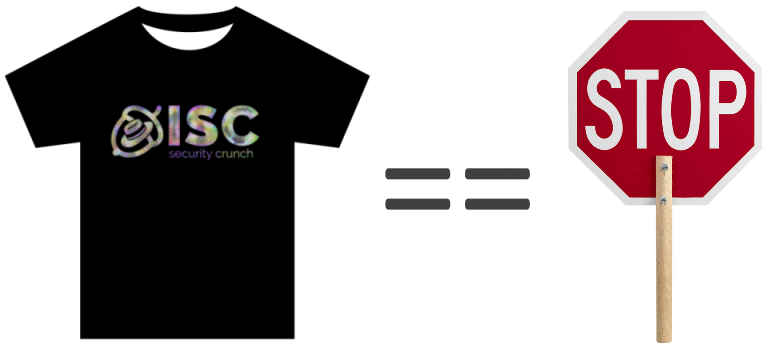


# Fetching Resources

Let's start...

We'll need: 
*    **0.993.dat** : this is the checkpoint of the leaked trained neural network; if our adversarial sample works on this model, it should also work on the model that the car uses
*    **\*GTSRB Test Set** : this is a dataset that contains images of traffic signs which we can use for debugging; we don't actually need it.
*    **isc-mask.png** : this is the ISC's logo which will be 'colored' (just like in the shirt above) so it confuses the neural network

\* *German Traffic Sign Recognition Benchmark (GTSRB)*


I've already handled most of this for you; just solve **[TODO 1]** and **[TODO 2]** and run the code.

In [8]:
# Fetch German Traffic Sign Recognition Benchmark Dataset (Test)
!wget -nc https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Test_Images.zip
!wget -nc https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Test_GT.zip


# TODO[1]: add a command to download http://isc-lab.overfitted.io/static/0.993.dat
!wget -nc http://isc-lab.overfitted.io/static/0.993.dat
# TODO[2]: also download: http://isc-lab.overfitted.io/static/isc-mask.png
!wget -nc http://isc-lab.overfitted.io/static/isc-mask.png



# *sigh*
!unzip GTSRB_Final_Test_Images.zip
!unzip GTSRB_Final_Test_GT.zip

Streaming output truncated to the last 5000 lines.
  inflating: GTSRB/Final_Test/Images/07635.ppm  
  inflating: GTSRB/Final_Test/Images/07636.ppm  
  inflating: GTSRB/Final_Test/Images/07637.ppm  
  inflating: GTSRB/Final_Test/Images/07638.ppm  
  inflating: GTSRB/Final_Test/Images/07639.ppm  
  inflating: GTSRB/Final_Test/Images/07640.ppm  
  inflating: GTSRB/Final_Test/Images/07641.ppm  
  inflating: GTSRB/Final_Test/Images/07642.ppm  
  inflating: GTSRB/Final_Test/Images/07643.ppm  
  inflating: GTSRB/Final_Test/Images/07644.ppm  
  inflating: GTSRB/Final_Test/Images/07645.ppm  
  inflating: GTSRB/Final_Test/Images/07646.ppm  
  inflating: GTSRB/Final_Test/Images/07647.ppm  
  inflating: GTSRB/Final_Test/Images/07648.ppm  
  inflating: GTSRB/Final_Test/Images/07649.ppm  
  inflating: GTSRB/Final_Test/Images/07650.ppm  
  inflating: GTSRB/Final_Test/Images/07651.ppm  
  inflating: GTSRB/Final_Test/Images/07652.ppm  
  inflating: GTSRB/Final_Test/Images/07653.ppm  
  inflating: GTSRB

# Dataset Loading

This just loads the dataset into a more friendly structure that we can use later. It's not very interesting.

What you'll need from here:
* **ID_TO_LABEL** : this dictionary maps a traffic sign's numeric id (**int**) to its readable (**string**) format; the neural network outputs a number for each recognized traffic sign - so we use this to get its actual description and understand the output.

* **LABEL_TO_ID** : pretty much the inverse of **ID_TO_LABEL**

Luckily no TODOs here; just run the code and continue.

In [9]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms, datasets
import pandas as pd
import os
from PIL import Image

ID_TO_LABEL = {
    0: '20_speed',
    1: '30_speed',
    2: '50_speed',
    3: '60_speed',
    4: '70_speed',
    5: '80_speed',
    6: '80_lifted',
    7: '100_speed',
    8: '120_speed',
    9: 'no_overtaking_general',
    10: 'no_overtaking_trucks',
    11: 'right_of_way_crossing',
    12: 'right_of_way_general',
    13: 'give_way',
    14: 'stop',
    15: 'no_way_general',
    16: 'no_way_trucks',
    17: 'no_way_one_way',
    18: 'attention_general',
    19: 'attention_left_turn',
    20: 'attention_right_turn',
    21: 'attention_curvy',
    22: 'attention_bumpers',
    23: 'attention_slippery',
    24: 'attention_bottleneck',
    25: 'attention_construction',
    26: 'attention_traffic_light',
    27: 'attention_pedestrian',
    28: 'attention_children',
    29: 'attention_bikes',
    30: 'attention_snowflake',
    31: 'attention_deer',
    32: 'lifted_general',
    33: 'turn_right',
    34: 'turn_left',
    35: 'turn_straight',
    36: 'turn_straight_right',
    37: 'turn_straight_left',
    38: 'turn_right_down',
    39: 'turn_left_down',
    40: 'turn_circle',
    41: 'lifted_no_overtaking_general',
    42: 'lifted_no_overtaking_trucks'
}

LABEL_TO_ID = {l:c for c,l in ID_TO_LABEL.items()}


class TrafficSignDataset(Dataset):

    def __init__(self, csv_file, root_dir, transform=None):
        self.labels_frame = pd.read_csv(csv_file, sep=";")
        self.root_dir = root_dir
        self.transform = transform
        
    def __len__(self):
        return len(self.labels_frame)
    
    def __getitem__(self, idx):
        img = self.labels_frame.iloc[idx]
        image = Image.open(os.path.join(self.root_dir, img['Filename']))
        label = img['ClassId']
        
        if self.transform:
            image = self.transform(image)
        
        sample = [image, label]
        
        return sample

test_dataset_root = 'GTSRB/Final_Test/Images/'
test_image_folder = TrafficSignDataset('GT-final_test.csv', test_dataset_root,
                           transform=transforms.Compose([
                               transforms.Resize(224),
                               transforms.CenterCrop(224),
                               transforms.ToTensor(),
                               
                           ]))

test_dataloader = torch.utils.data.DataLoader(test_image_folder, batch_size=1, shuffle=True)


# Model Loading

We don't know the architecture of the network; we need to know its name so we can load the parameters into an object of the corresponding class.

**[TODO 3]**: take a look into **0.993.dat**; can you find the name of the architecture? It should be a pretty popular model.

In [10]:
import torch.nn as nn
import torch

# [TODO 3]: fill the model's architecture in the variable below
model_name = 'resnet18'

exec('from torchvision.models import ' + model_name)



# this defines the model's overall structure
class TrafficSignClassifier(nn.Module):
  def __init__(self, num_classes=43, affine=True):
      super().__init__()

      exec('self.' + model_name + ' = ' + model_name + '(pretrained=False, norm_layer = nn.InstanceNorm2d, num_classes = num_classes)')

  def forward(self, x):
      x = eval('self.' + model_name + '(x)')

      return x

# this loads the leaked model's parameters
model = TrafficSignClassifier(num_classes = 43)
model.load_state_dict(torch.load('0.993.dat', map_location=torch.device('cpu')))
model.eval()

TrafficSignClassifier(
  (resnet18): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): InstanceNorm2d(64, eps=1e-05, mom

# Short Test & Results

This is not part of the "hacking" process. We run a quick test only to see if we loaded the model correctly. 

Once again, in a real attack we pretty much don't have the dataset (and won't need it).

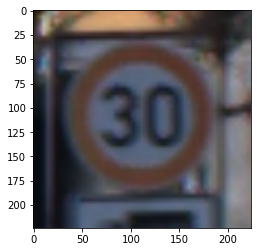

Predicted: 30_speed Expected: 30_speed


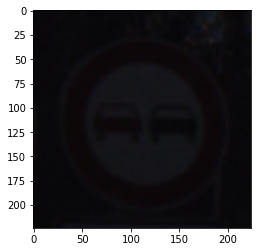

Predicted: no_overtaking_general Expected: no_overtaking_general


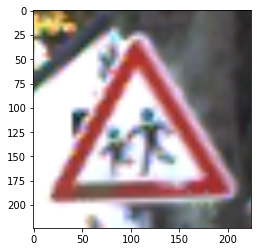

Predicted: attention_children Expected: attention_children


In [11]:
import matplotlib.pyplot as plt
import cv2

# this is added so we won't run & display the entire dataset here
IMG_LIMIT = 3

# iterate through the GTSRB test dataset
# X_test : image (actually tensor) which contains a traffic sign
# y_test : array (actually still a tensor) which  
for batch_id, (X_test, y_test) in enumerate(test_dataloader):

  # stop if too many images were shown
  if batch_id + 1 > IMG_LIMIT:
    break

  # y_pred : an array (tensor) which contains probabilities for each known traffic sign
  y_pred = model(X_test).detach()

  # this converts the tensor to an image so we can display it
  X_imgs = [img.permute(1, 2, 0).numpy() for img in X_test]

  # from the prediction, we take the index (id) of the traffic sign that has the highest probability
  y_pred = torch.argmax(y_pred, dim=1)

  # we show some results and see if this is working
  for i in range(len(X_imgs)):
    plt.imshow(X_imgs[i])
    plt.show()
    cv2.imwrite(str(i) + '.png', cv2.cvtColor(X_imgs[i] * 255, cv2.COLOR_RGB2BGR))
    print('Predicted:', ID_TO_LABEL[y_pred[i].item()], 'Expected:', ID_TO_LABEL[y_test[i].item()])

  

# Generating Adversarial Samples

Now let's move to the interesting part: creating adversarial samples. The PyTorch framework will do the low-level math for you automatically - don't worry about that :)

## Steps

1.   Generate a **random image** with 3 channels (Red, Green, Blue); think of this image as a matrix made of *NUM_CHANNELS x WIDTH x HEIGHT* parameters -> these parameters will be tuned to generate a specific output in the neural network

2.   Run the image through the **neural network** and it will tell you the **probabilities** of it being any of the **known traffic signs**.

3.   Use the outputted **probabilities** to calculate the **error / loss**; this error is backpropagated to your image by PyTorch's autodifferentiation module (so you don't have to do the fancy math).

4.   Adjust the values of the pixels in the inverse direction of the received feedback (gradients). Once again, this is done by PyTorch.

5.   Go back to step 2 and repeat.

**[TODO 4]** requires you to specify the **shape** of the image; a shape says how many dimensions your structure (tensor) has. 
E.g., the shape (2, 2) describes an array with 2 rows and 2 columns.

For **[TODO 5]** you'll have to pick a **learning rate** - there's no "correct" answer here, just see what works for you.

In **[TODO 6]** you'll have to specify which traffic sign you're targeting -- and in **[TODO 7]** you have to set the number of iterations (epochs).

----
*At this point...* if you solved the TODOs the algorithm should generate and draw **noisy images** that are classified as the traffic sign you targeted.

## Applying the Mask

For **[TODO 8]** you have to use the ISC mask when generating images. However, you'll notice that the algorithm is coloring the background and not the logo. For the last task (**[TODO 9]**) you'll have to invert the mask so the background stays black and the logo is colored.

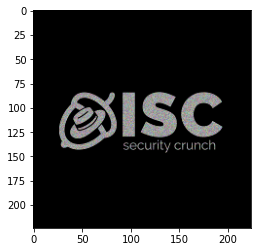

Predicted: no_overtaking_general Adversarial loss: 6.395349502563477 Confidence: 21.902433037757874 %


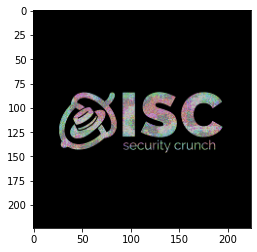

Predicted: attention_right_turn Adversarial loss: 6.321789264678955 Confidence: 14.633503556251526 %


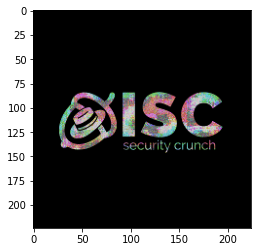

Predicted: attention_right_turn Adversarial loss: 5.497547149658203 Confidence: 18.875020742416382 %


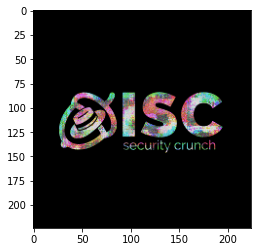

Predicted: no_overtaking_general Adversarial loss: 4.987405776977539 Confidence: 12.433267384767532 %


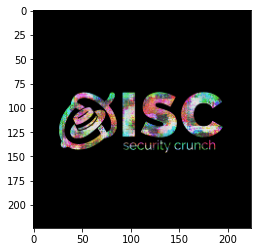

Predicted: turn_right_down Adversarial loss: 4.622193336486816 Confidence: 10.208228975534439 %


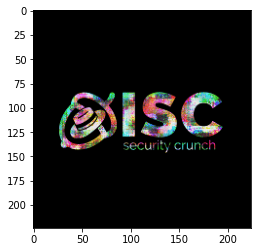

Predicted: attention_right_turn Adversarial loss: 4.154163837432861 Confidence: 14.569506049156189 %


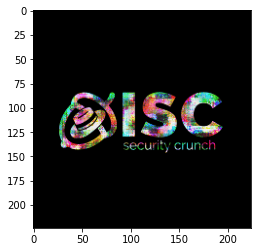

Predicted: no_overtaking_general Adversarial loss: 3.3681275844573975 Confidence: 11.644957214593887 %


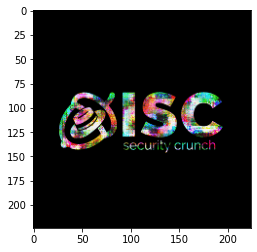

Predicted: no_overtaking_general Adversarial loss: 3.1012110710144043 Confidence: 21.483276784420013 %


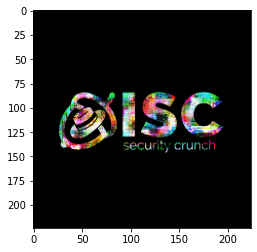

Predicted: no_overtaking_general Adversarial loss: 2.7862770557403564 Confidence: 13.57349157333374 %


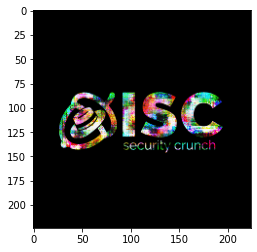

Predicted: attention_bumpers Adversarial loss: 1.4885408878326416 Confidence: 22.57017493247986 %


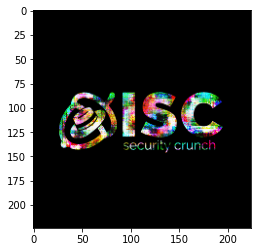

Predicted: 120_speed Adversarial loss: 2.1293578147888184 Confidence: 14.21637237071991 %


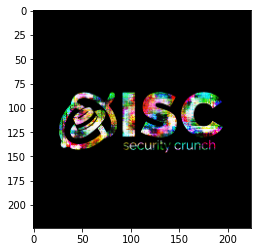

Predicted: attention_bumpers Adversarial loss: 1.7727272510528564 Confidence: 16.98690801858902 %


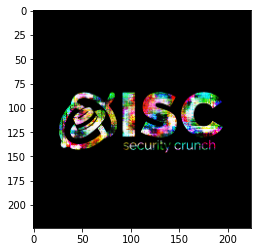

Predicted: attention_bumpers Adversarial loss: 1.8706856966018677 Confidence: 15.401799976825714 %


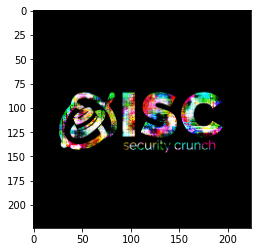

Predicted: attention_bumpers Adversarial loss: 1.1264797449111938 Confidence: 32.41724371910095 %


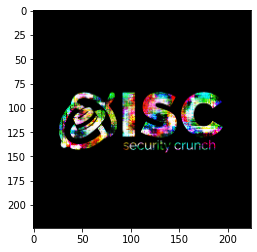

Predicted: attention_bumpers Adversarial loss: 0.17301848530769348 Confidence: 84.11220908164978 %


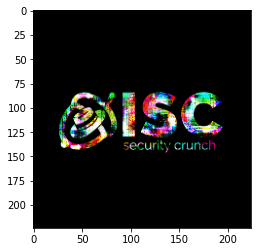

Predicted: attention_bumpers Adversarial loss: 0.30760329961776733 Confidence: 73.52069020271301 %


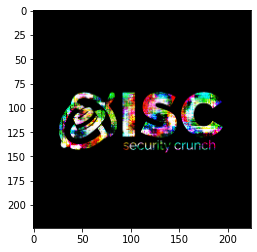

Predicted: attention_bumpers Adversarial loss: 0.24948377907276154 Confidence: 77.9202938079834 %


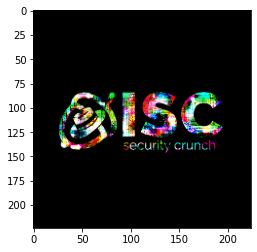

Predicted: attention_bumpers Adversarial loss: 0.46800586581230164 Confidence: 62.62498497962952 %


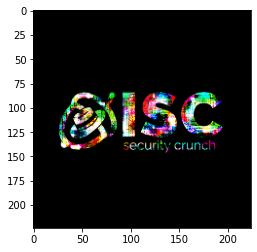

Predicted: attention_bumpers Adversarial loss: 0.4932313561439514 Confidence: 61.06500029563904 %


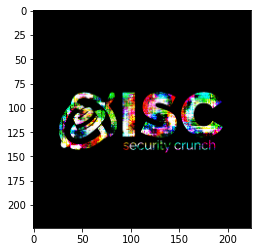

Predicted: attention_bumpers Adversarial loss: 0.5986945033073425 Confidence: 54.95285391807556 %


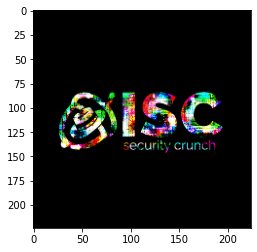

Predicted: attention_bumpers Adversarial loss: 0.4288708567619324 Confidence: 65.1244044303894 %


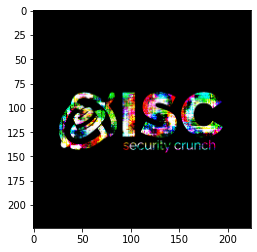

Predicted: attention_bumpers Adversarial loss: 0.18270736932754517 Confidence: 83.30118656158447 %


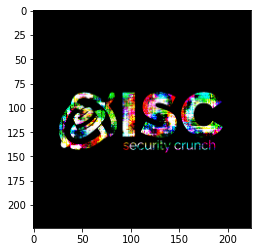

Predicted: attention_bumpers Adversarial loss: 0.15339607000350952 Confidence: 85.7789933681488 %


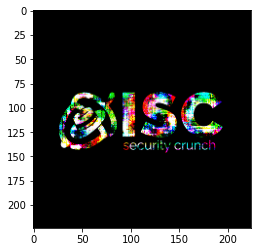

Predicted: attention_bumpers Adversarial loss: 0.30336129665374756 Confidence: 73.83322715759277 %


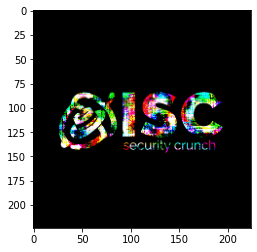

Predicted: attention_bumpers Adversarial loss: 0.24540632963180542 Confidence: 78.23866009712219 %


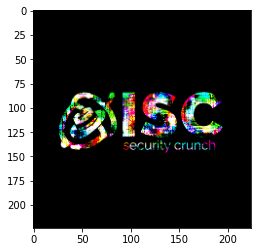

Predicted: attention_bumpers Adversarial loss: 0.29936251044273376 Confidence: 74.12906289100647 %


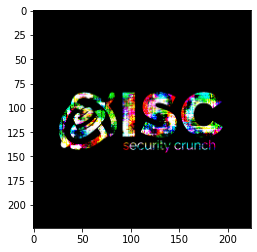

Predicted: attention_bumpers Adversarial loss: 0.047700975090265274 Confidence: 95.34188508987427 %


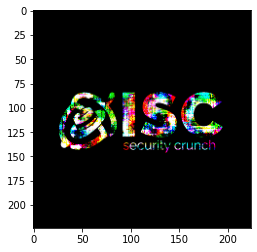

Predicted: attention_bumpers Adversarial loss: 0.05422647297382355 Confidence: 94.7217583656311 %


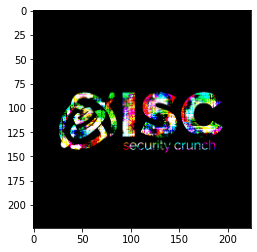

Predicted: attention_bumpers Adversarial loss: 0.12160652130842209 Confidence: 88.5496735572815 %


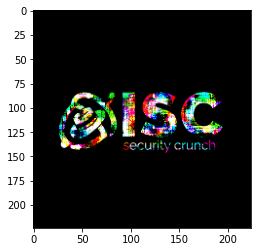

Predicted: attention_bumpers Adversarial loss: 0.11953721195459366 Confidence: 88.73310089111328 %


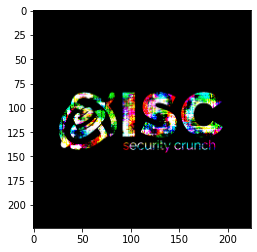

Predicted: attention_bumpers Adversarial loss: 0.12639471888542175 Confidence: 88.12669515609741 %


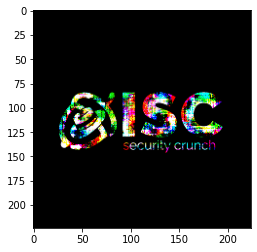

Predicted: attention_bumpers Adversarial loss: 0.13509953022003174 Confidence: 87.36289739608765 %


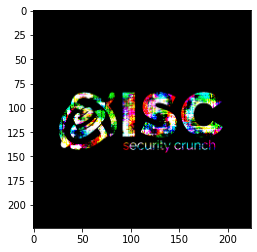

Predicted: attention_bumpers Adversarial loss: 0.0625806599855423 Confidence: 93.93373131752014 %


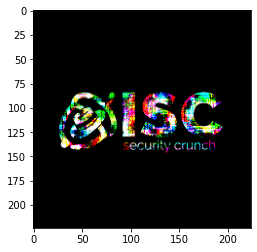

Predicted: attention_bumpers Adversarial loss: 0.11229156702756882 Confidence: 89.37836289405823 %


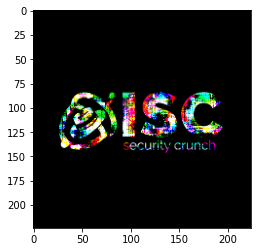

Predicted: attention_bumpers Adversarial loss: 0.12510202825069427 Confidence: 88.24068903923035 %


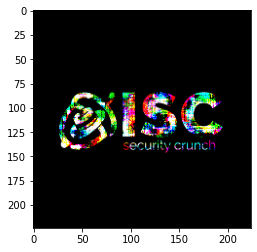

Predicted: attention_bumpers Adversarial loss: 0.04101625829935074 Confidence: 95.98135352134705 %


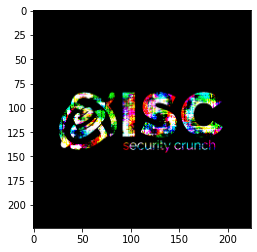

Predicted: attention_bumpers Adversarial loss: 0.14151069521903992 Confidence: 86.80458664894104 %


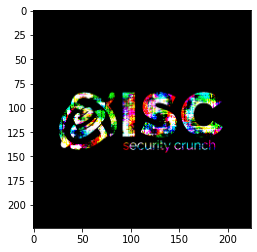

Predicted: attention_bumpers Adversarial loss: 0.15143245458602905 Confidence: 85.94759106636047 %


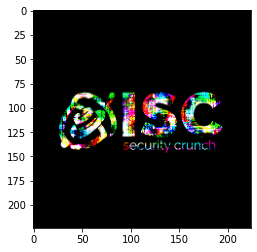

Predicted: attention_bumpers Adversarial loss: 0.06941309571266174 Confidence: 93.2941198348999 %


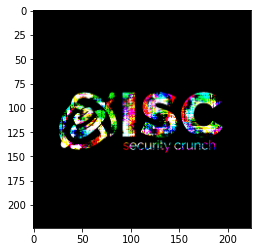

Predicted: attention_bumpers Adversarial loss: 0.06575176119804382 Confidence: 93.63632798194885 %


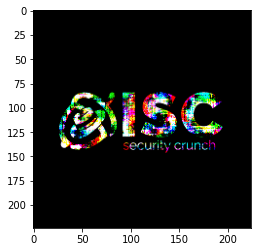

Predicted: attention_bumpers Adversarial loss: 0.06573959439992905 Confidence: 93.63746643066406 %


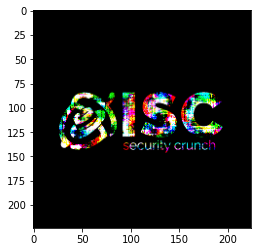

Predicted: attention_bumpers Adversarial loss: 0.021548785269260406 Confidence: 97.8681743144989 %


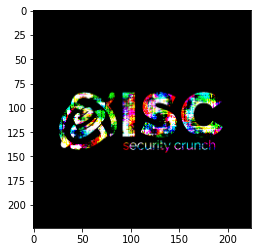

Predicted: attention_bumpers Adversarial loss: 0.023916322737932205 Confidence: 97.63674139976501 %


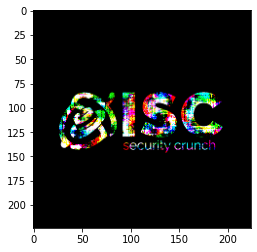

Predicted: attention_bumpers Adversarial loss: 0.17015962302684784 Confidence: 84.35301780700684 %


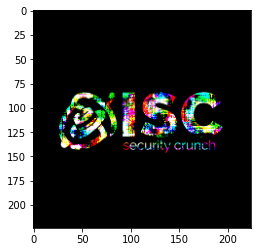

Predicted: attention_bumpers Adversarial loss: 0.10467271506786346 Confidence: 90.06192088127136 %


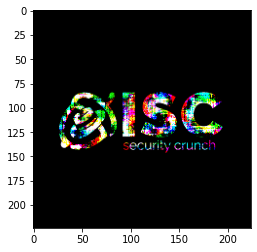

Predicted: attention_bumpers Adversarial loss: 0.10931115597486496 Confidence: 89.64514136314392 %


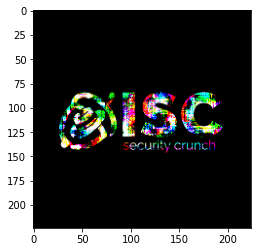

Predicted: attention_bumpers Adversarial loss: 0.10369137674570084 Confidence: 90.15035033226013 %


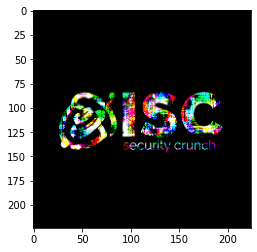

Predicted: attention_bumpers Adversarial loss: 0.08712482452392578 Confidence: 91.65626764297485 %


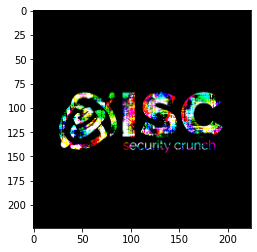

Predicted: attention_bumpers Adversarial loss: 0.0345628596842289 Confidence: 96.60276174545288 %


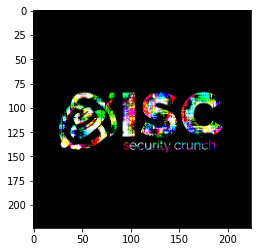

Predicted: attention_bumpers Adversarial loss: 0.041796062141656876 Confidence: 95.90653777122498 %


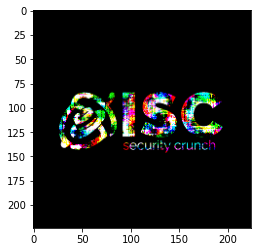

Predicted: attention_bumpers Adversarial loss: 0.036894768476486206 Confidence: 96.37775421142578 %


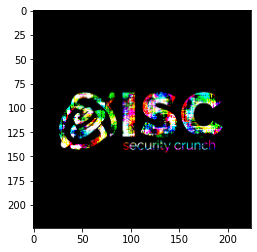

Predicted: attention_bumpers Adversarial loss: 0.027128467336297035 Confidence: 97.32362031936646 %


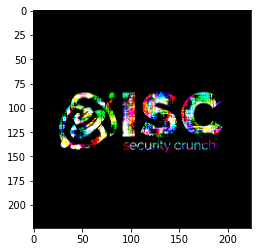

Predicted: attention_bumpers Adversarial loss: 0.05548854172229767 Confidence: 94.60228681564331 %


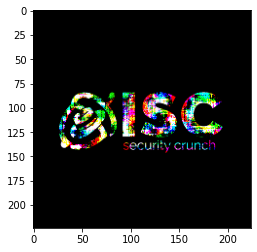

Predicted: attention_bumpers Adversarial loss: 0.03346709534525871 Confidence: 96.70867323875427 %


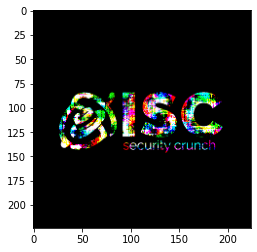

Predicted: attention_bumpers Adversarial loss: 0.021898960694670677 Confidence: 97.83390760421753 %


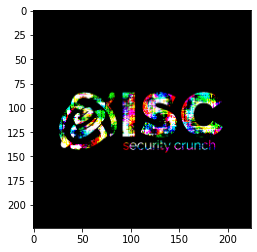

Predicted: attention_bumpers Adversarial loss: 0.033970534801483154 Confidence: 96.66000008583069 %


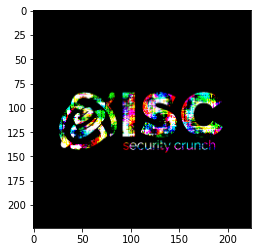

Predicted: attention_bumpers Adversarial loss: 0.015462400391697884 Confidence: 98.46565127372742 %


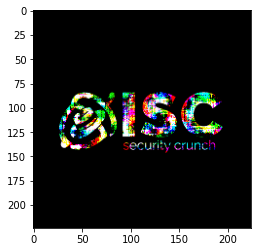

Predicted: attention_bumpers Adversarial loss: 0.011510391719639301 Confidence: 98.85556101799011 %


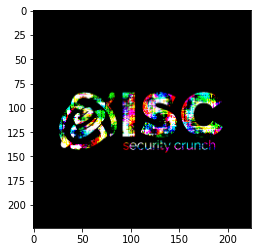

Predicted: attention_bumpers Adversarial loss: 0.01536262221634388 Confidence: 98.47548007965088 %


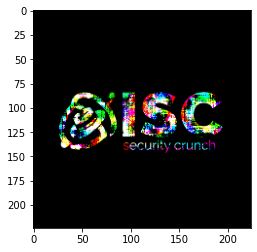

Predicted: attention_bumpers Adversarial loss: 0.03154643625020981 Confidence: 96.89459800720215 %


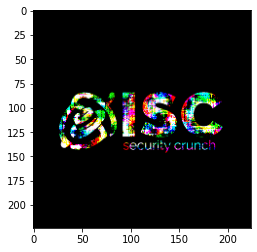

Predicted: attention_bumpers Adversarial loss: 0.016815699636936188 Confidence: 98.33248853683472 %


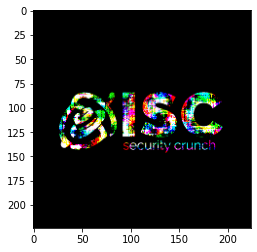

Predicted: attention_bumpers Adversarial loss: 0.02634073793888092 Confidence: 97.40031361579895 %


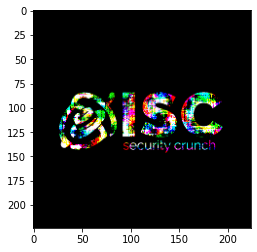

Predicted: attention_bumpers Adversarial loss: 0.02169787511229515 Confidence: 97.85358309745789 %


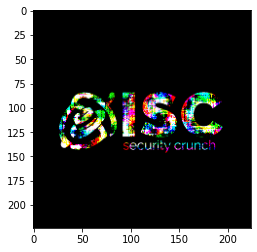

Predicted: attention_bumpers Adversarial loss: 0.008447745814919472 Confidence: 99.15878176689148 %


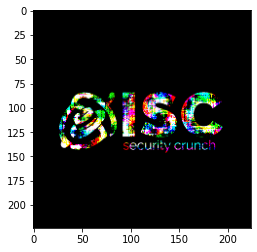

Predicted: attention_bumpers Adversarial loss: 0.03114473633468151 Confidence: 96.93352580070496 %


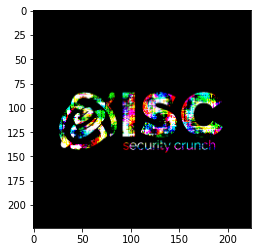

Predicted: attention_bumpers Adversarial loss: 0.024331755936145782 Confidence: 97.59618639945984 %


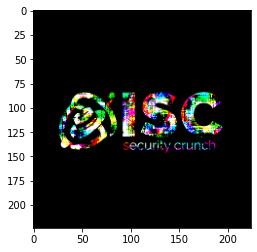

Predicted: attention_bumpers Adversarial loss: 0.026822827756404877 Confidence: 97.35336899757385 %


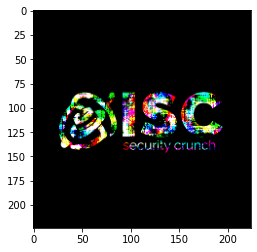

Predicted: attention_bumpers Adversarial loss: 0.03981276601552963 Confidence: 96.096932888031 %


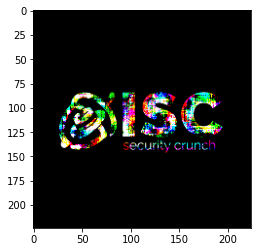

Predicted: attention_bumpers Adversarial loss: 0.029147939756512642 Confidence: 97.12727665901184 %


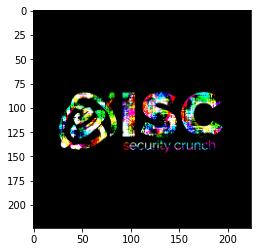

Predicted: attention_bumpers Adversarial loss: 0.02117164246737957 Confidence: 97.9050874710083 %


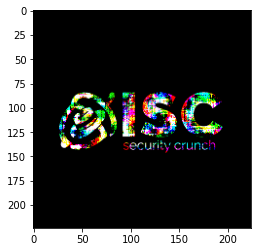

Predicted: attention_bumpers Adversarial loss: 0.03469839319586754 Confidence: 96.58966660499573 %


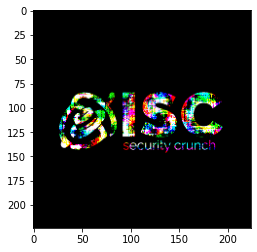

Predicted: attention_bumpers Adversarial loss: 0.07752583920955658 Confidence: 92.54031181335449 %


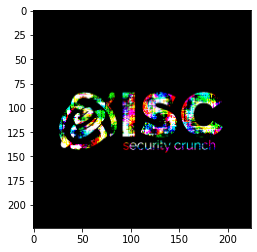

Predicted: attention_bumpers Adversarial loss: 0.022480761632323265 Confidence: 97.77700304985046 %


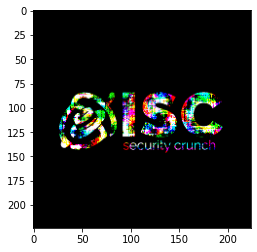

Predicted: attention_bumpers Adversarial loss: 0.06650872528553009 Confidence: 93.56547594070435 %


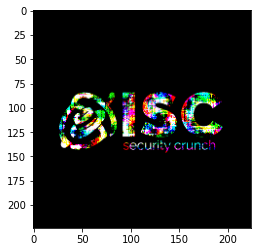

Predicted: attention_bumpers Adversarial loss: 0.02717464230954647 Confidence: 97.31912612915039 %


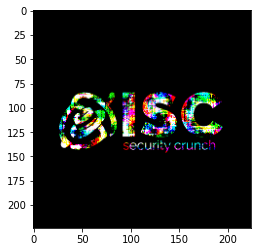

Predicted: attention_bumpers Adversarial loss: 0.0161922387778759 Confidence: 98.39381575584412 %


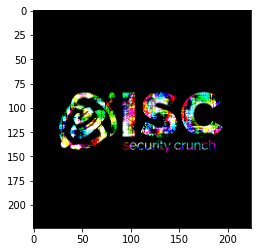

Predicted: attention_bumpers Adversarial loss: 0.012769479304552078 Confidence: 98.73117208480835 %


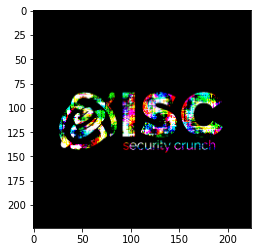

Predicted: attention_bumpers Adversarial loss: 0.018434623256325722 Confidence: 98.17342758178711 %


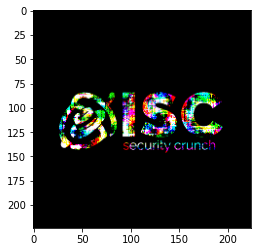

Predicted: attention_bumpers Adversarial loss: 0.04707134887576103 Confidence: 95.401930809021 %


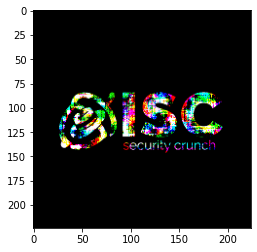

Predicted: attention_bumpers Adversarial loss: 0.01125616766512394 Confidence: 98.8806962966919 %


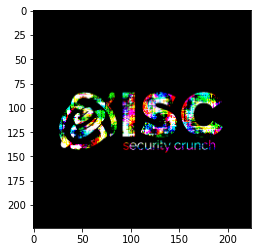

Predicted: attention_bumpers Adversarial loss: 0.03652337193489075 Confidence: 96.41355872154236 %


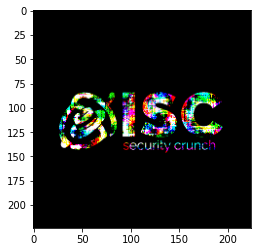

Predicted: attention_bumpers Adversarial loss: 0.033121176064014435 Confidence: 96.7421293258667 %


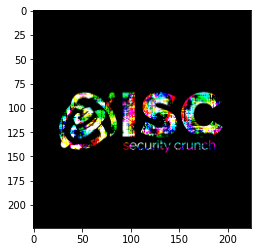

Predicted: attention_bumpers Adversarial loss: 0.012281154282391071 Confidence: 98.77939224243164 %


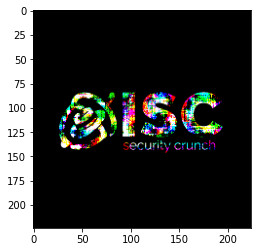

Predicted: attention_bumpers Adversarial loss: 0.019188959151506424 Confidence: 98.09939861297607 %


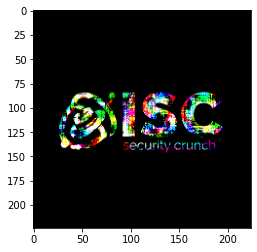

Predicted: attention_bumpers Adversarial loss: 0.05031438171863556 Confidence: 95.09304165840149 %


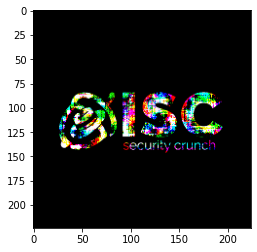

Predicted: attention_bumpers Adversarial loss: 0.015606063418090343 Confidence: 98.45150709152222 %


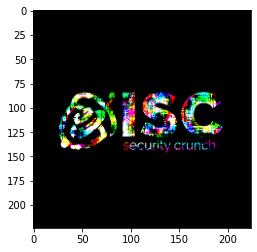

Predicted: attention_bumpers Adversarial loss: 0.007492654491215944 Confidence: 99.25353527069092 %


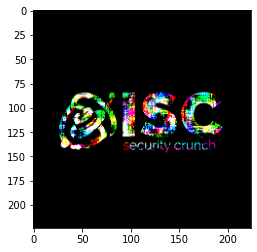

Predicted: attention_bumpers Adversarial loss: 0.01663821004331112 Confidence: 98.34994673728943 %


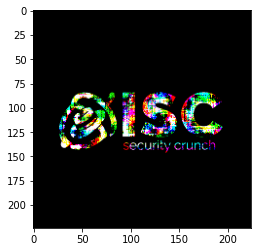

Predicted: attention_bumpers Adversarial loss: 0.020201412960886955 Confidence: 98.00012707710266 %


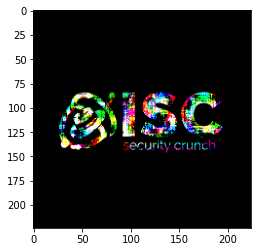

Predicted: attention_bumpers Adversarial loss: 0.015612166374921799 Confidence: 98.45090508460999 %


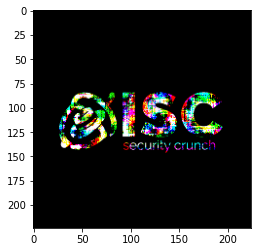

Predicted: attention_bumpers Adversarial loss: 0.007032286375761032 Confidence: 99.29924011230469 %


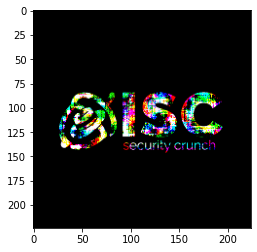

Predicted: attention_bumpers Adversarial loss: 0.018220432102680206 Confidence: 98.19445610046387 %


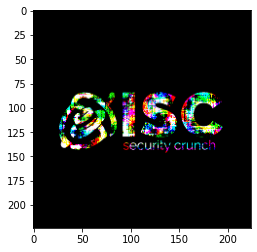

Predicted: attention_bumpers Adversarial loss: 0.04377497360110283 Confidence: 95.71692943572998 %


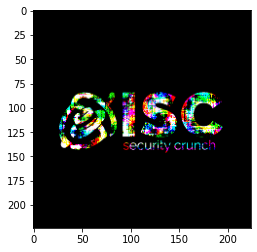

Predicted: attention_bumpers Adversarial loss: 0.03981975466012955 Confidence: 96.09626531600952 %


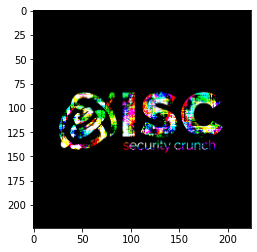

Predicted: attention_bumpers Adversarial loss: 0.014010174199938774 Confidence: 98.60875010490417 %


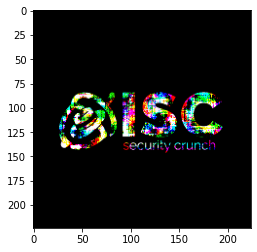

Predicted: attention_bumpers Adversarial loss: 0.02774839662015438 Confidence: 97.26330637931824 %


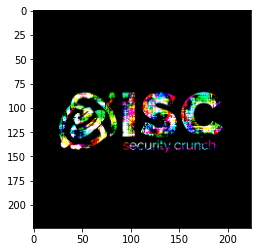

Predicted: attention_bumpers Adversarial loss: 0.012981546111404896 Confidence: 98.71023297309875 %


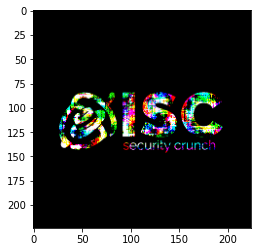

Predicted: attention_bumpers Adversarial loss: 0.011865159496665001 Confidence: 98.82049560546875 %


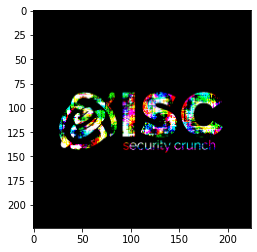

Predicted: attention_bumpers Adversarial loss: 0.0054123299196362495 Confidence: 99.46022629737854 %


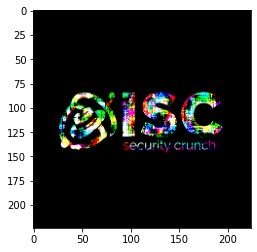

Predicted: attention_bumpers Adversarial loss: 0.025456400588154793 Confidence: 97.48649001121521 %


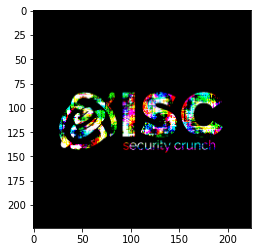

Predicted: attention_bumpers Adversarial loss: 0.008793676272034645 Confidence: 99.12448525428772 %


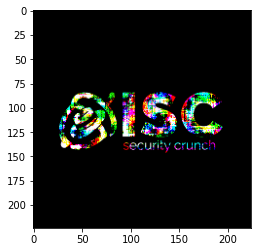

Predicted: attention_bumpers Adversarial loss: 0.03513607755303383 Confidence: 96.5474009513855 %


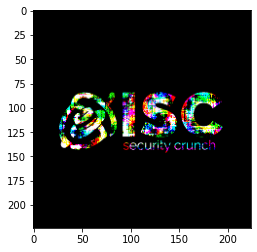

Predicted: attention_bumpers Adversarial loss: 0.02678801119327545 Confidence: 97.35676050186157 %


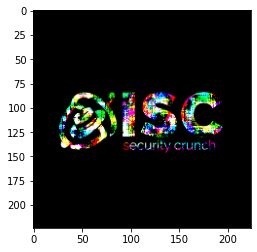

Predicted: attention_bumpers Adversarial loss: 0.020540615543723106 Confidence: 97.9668915271759 %


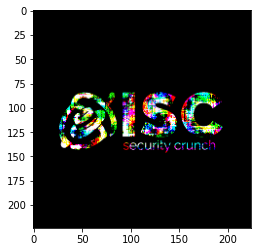

Predicted: attention_bumpers Adversarial loss: 0.019444216042757034 Confidence: 98.07435870170593 %


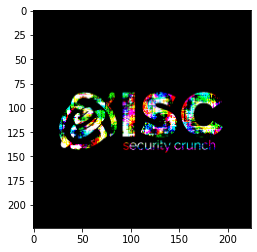

Predicted: attention_bumpers Adversarial loss: 0.01574724167585373 Confidence: 98.4376072883606 %


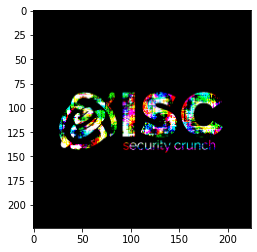

Predicted: attention_bumpers Adversarial loss: 0.013151685707271099 Confidence: 98.69344234466553 %


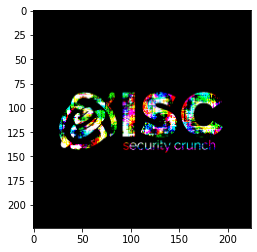

Predicted: attention_bumpers Adversarial loss: 0.027628963813185692 Confidence: 97.27492332458496 %


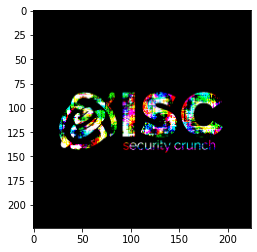

Predicted: attention_bumpers Adversarial loss: 0.023153897374868393 Confidence: 97.71121144294739 %


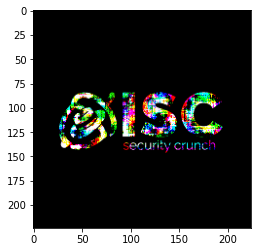

Predicted: attention_bumpers Adversarial loss: 0.04984394088387489 Confidence: 95.13778686523438 %


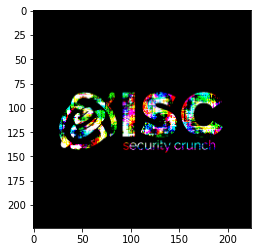

Predicted: attention_bumpers Adversarial loss: 0.04791712760925293 Confidence: 95.32127976417542 %


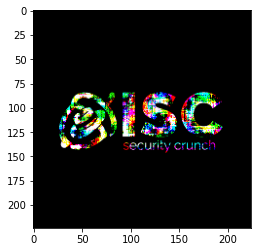

Predicted: attention_bumpers Adversarial loss: 0.010502662509679794 Confidence: 98.95523190498352 %


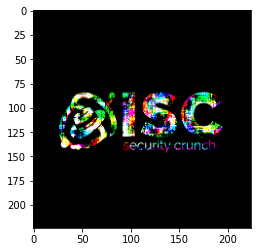

Predicted: attention_bumpers Adversarial loss: 0.011956688947975636 Confidence: 98.81145358085632 %


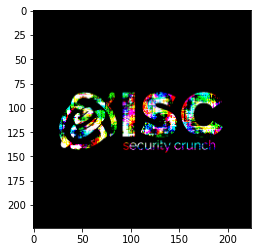

Predicted: attention_bumpers Adversarial loss: 0.008269120007753372 Confidence: 99.17649626731873 %


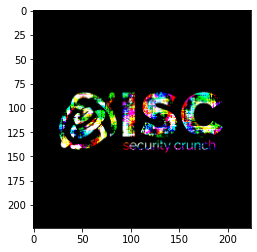

Predicted: attention_bumpers Adversarial loss: 0.008275740779936314 Confidence: 99.1758406162262 %


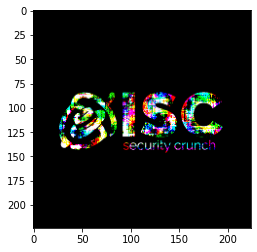

Predicted: attention_bumpers Adversarial loss: 0.013856171630322933 Confidence: 98.62393736839294 %


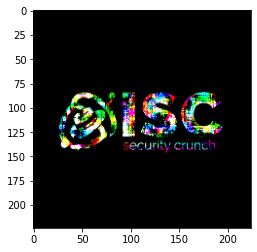

Predicted: attention_bumpers Adversarial loss: 0.010306469164788723 Confidence: 98.97464513778687 %


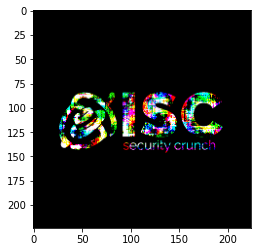

Predicted: attention_bumpers Adversarial loss: 0.014274628832936287 Confidence: 98.58267903327942 %


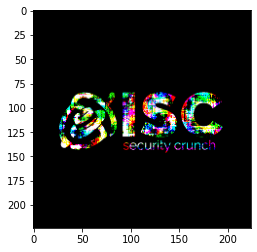

Predicted: attention_bumpers Adversarial loss: 0.027621079236268997 Confidence: 97.27569222450256 %


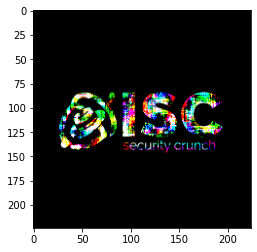

Predicted: attention_bumpers Adversarial loss: 0.010776890441775322 Confidence: 98.92809987068176 %


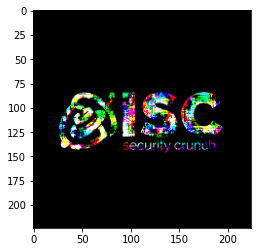

Predicted: attention_bumpers Adversarial loss: 0.014997935853898525 Confidence: 98.51139783859253 %


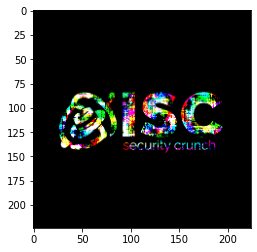

Predicted: attention_bumpers Adversarial loss: 0.0075648268684744835 Confidence: 99.24637079238892 %


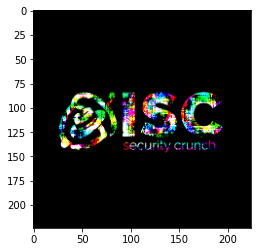

Predicted: attention_bumpers Adversarial loss: 0.03504721820354462 Confidence: 96.55598402023315 %


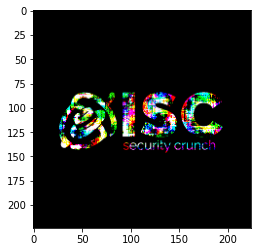

Predicted: attention_bumpers Adversarial loss: 0.019050605595111847 Confidence: 98.11297059059143 %


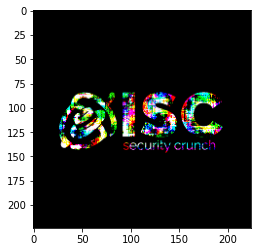

Predicted: attention_bumpers Adversarial loss: 0.011477983556687832 Confidence: 98.85876178741455 %


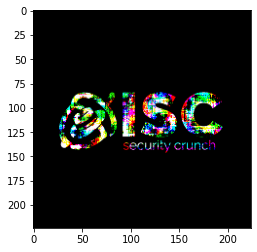

Predicted: attention_bumpers Adversarial loss: 0.027882421389222145 Confidence: 97.25027084350586 %


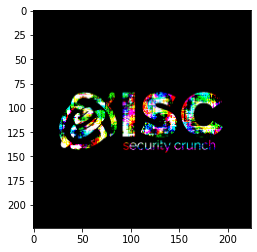

Predicted: attention_bumpers Adversarial loss: 0.010094070807099342 Confidence: 98.99566769599915 %


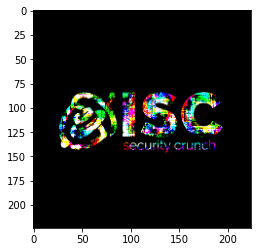

Predicted: attention_bumpers Adversarial loss: 0.008493373170495033 Confidence: 99.15425777435303 %


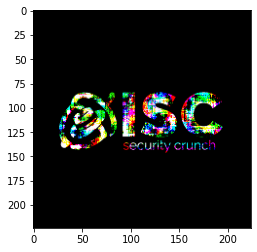

Predicted: attention_bumpers Adversarial loss: 0.017524169757962227 Confidence: 98.26284646987915 %


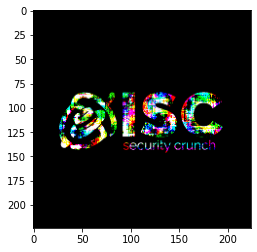

Predicted: attention_bumpers Adversarial loss: 0.009181066416203976 Confidence: 99.08609390258789 %


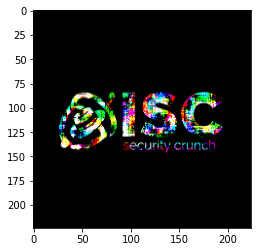

Predicted: attention_bumpers Adversarial loss: 0.00840058084577322 Confidence: 99.16346073150635 %


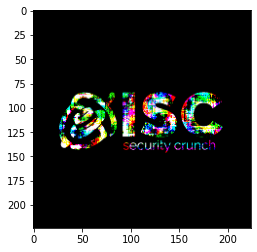

Predicted: attention_bumpers Adversarial loss: 0.006048588547855616 Confidence: 99.39696788787842 %


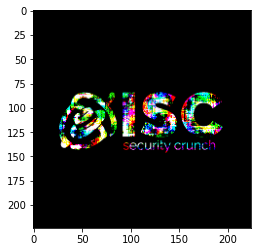

Predicted: attention_bumpers Adversarial loss: 0.011067078448832035 Confidence: 98.89939427375793 %


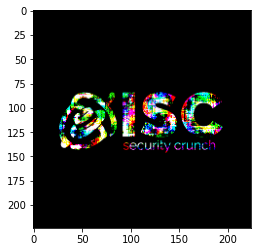

Predicted: attention_bumpers Adversarial loss: 0.0053983391262590885 Confidence: 99.46162104606628 %


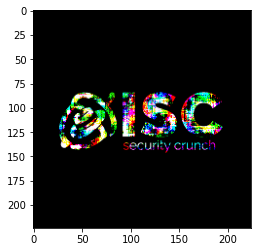

Predicted: attention_bumpers Adversarial loss: 0.00638930918648839 Confidence: 99.36310648918152 %


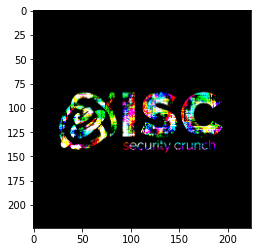

Predicted: attention_bumpers Adversarial loss: 0.009859907440841198 Confidence: 99.01885390281677 %


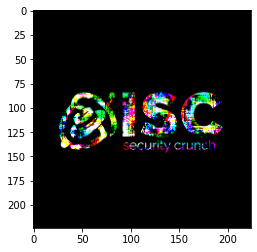

Predicted: attention_bumpers Adversarial loss: 0.009785185568034649 Confidence: 99.0262508392334 %


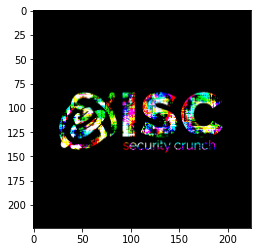

Predicted: attention_bumpers Adversarial loss: 0.004531471990048885 Confidence: 99.54788088798523 %


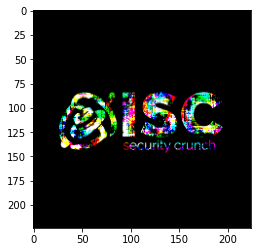

Predicted: attention_bumpers Adversarial loss: 0.021889863535761833 Confidence: 97.83479571342468 %


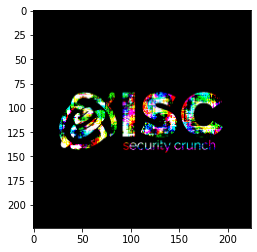

Predicted: attention_bumpers Adversarial loss: 0.0027852572966367006 Confidence: 99.72186088562012 %


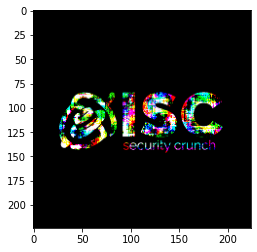

Predicted: attention_bumpers Adversarial loss: 0.006847487296909094 Confidence: 99.31759238243103 %


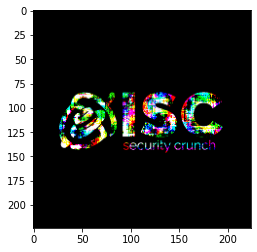

Predicted: attention_bumpers Adversarial loss: 0.0073965745978057384 Confidence: 99.26307201385498 %


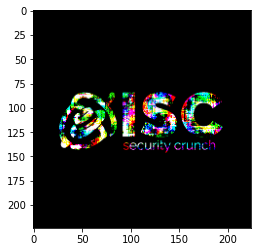

Predicted: attention_bumpers Adversarial loss: 0.003593774512410164 Confidence: 99.64126944541931 %


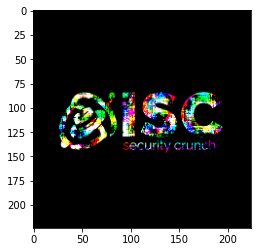

Predicted: attention_bumpers Adversarial loss: 0.009713172912597656 Confidence: 99.03338551521301 %


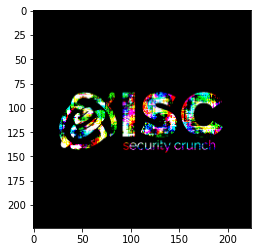

Predicted: attention_bumpers Adversarial loss: 0.005345812067389488 Confidence: 99.46684241294861 %


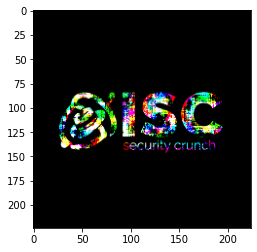

Predicted: attention_bumpers Adversarial loss: 0.014814956113696098 Confidence: 98.52942228317261 %


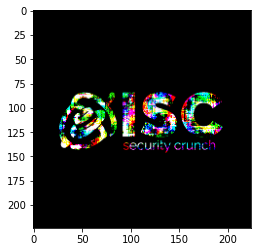

Predicted: attention_bumpers Adversarial loss: 0.005798542872071266 Confidence: 99.42182302474976 %


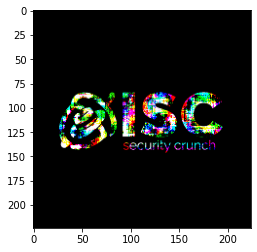

Predicted: attention_bumpers Adversarial loss: 0.007625400088727474 Confidence: 99.24036264419556 %


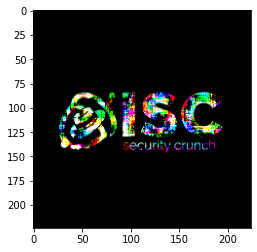

Predicted: attention_bumpers Adversarial loss: 0.011409393511712551 Confidence: 98.86554479598999 %


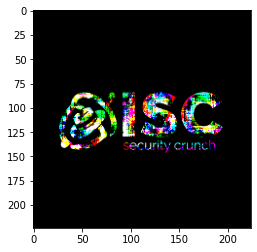

Predicted: attention_bumpers Adversarial loss: 0.024456003680825233 Confidence: 97.58406281471252 %


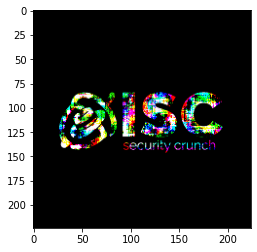

Predicted: attention_bumpers Adversarial loss: 0.011602777987718582 Confidence: 98.84642958641052 %


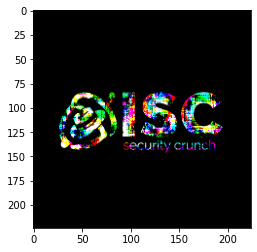

Predicted: attention_bumpers Adversarial loss: 0.020667903125286102 Confidence: 97.95442223548889 %


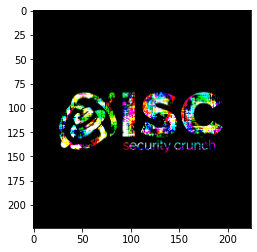

Predicted: attention_bumpers Adversarial loss: 0.005648366641253233 Confidence: 99.43675398826599 %


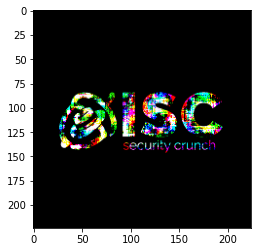

Predicted: attention_bumpers Adversarial loss: 0.0058397869579494 Confidence: 99.41772222518921 %


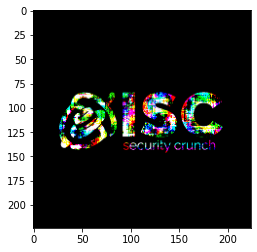

Predicted: attention_bumpers Adversarial loss: 0.006554770283401012 Confidence: 99.34666752815247 %


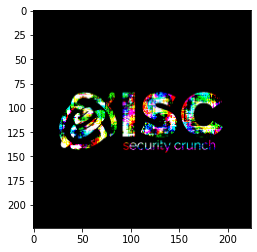

Predicted: attention_bumpers Adversarial loss: 0.003130656434223056 Confidence: 99.6874213218689 %


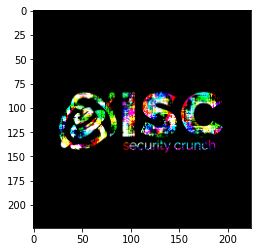

Predicted: attention_bumpers Adversarial loss: 0.004013223107904196 Confidence: 99.59948062896729 %


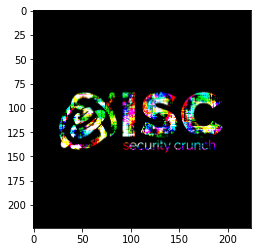

Predicted: attention_bumpers Adversarial loss: 0.011182021349668503 Confidence: 98.88802766799927 %


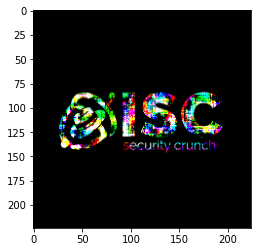

Predicted: attention_bumpers Adversarial loss: 0.015075675211846828 Confidence: 98.50373864173889 %


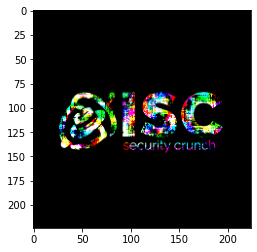

Predicted: attention_bumpers Adversarial loss: 0.005362768191844225 Confidence: 99.46516156196594 %


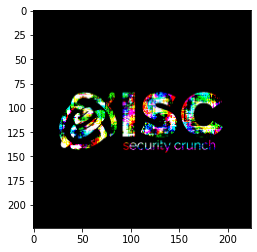

Predicted: attention_bumpers Adversarial loss: 0.01342671737074852 Confidence: 98.66630434989929 %


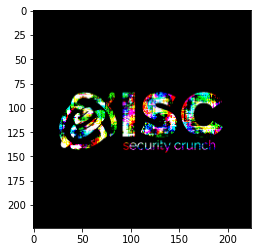

Predicted: attention_bumpers Adversarial loss: 0.033485423773527145 Confidence: 96.70690298080444 %


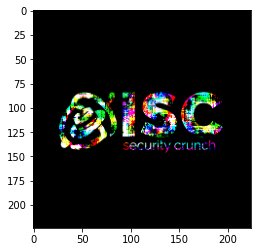

Predicted: attention_bumpers Adversarial loss: 0.007256224285811186 Confidence: 99.27700161933899 %


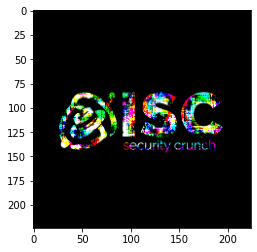

Predicted: attention_bumpers Adversarial loss: 0.012881049886345863 Confidence: 98.72015714645386 %


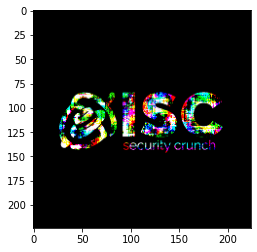

Predicted: attention_bumpers Adversarial loss: 0.018541935831308365 Confidence: 98.16288948059082 %


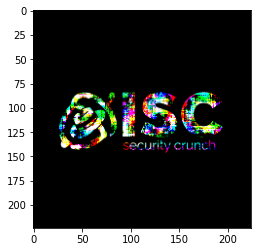

Predicted: attention_bumpers Adversarial loss: 0.01760030724108219 Confidence: 98.25536608695984 %


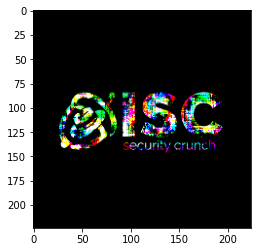

Predicted: attention_bumpers Adversarial loss: 0.007721813395619392 Confidence: 99.23079013824463 %


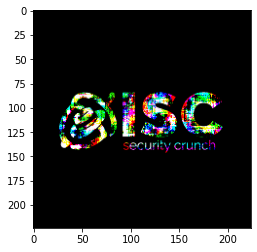

Predicted: attention_bumpers Adversarial loss: 0.006158304866403341 Confidence: 99.38606023788452 %


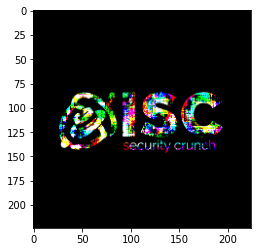

Predicted: attention_bumpers Adversarial loss: 0.030612584203481674 Confidence: 96.98512554168701 %


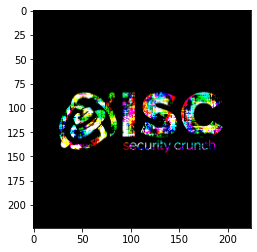

Predicted: attention_bumpers Adversarial loss: 0.004433089401572943 Confidence: 99.55767393112183 %


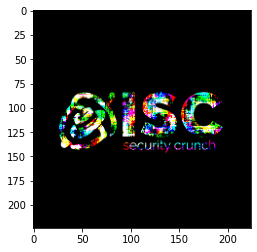

Predicted: attention_bumpers Adversarial loss: 0.008696303702890873 Confidence: 99.13414120674133 %


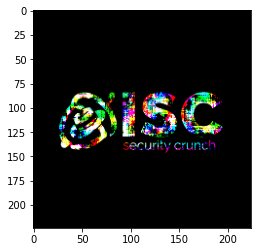

Predicted: attention_bumpers Adversarial loss: 0.00907097291201353 Confidence: 99.09700155258179 %


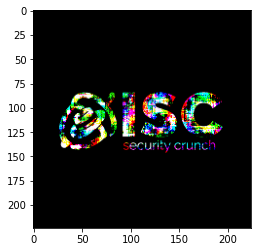

Predicted: attention_bumpers Adversarial loss: 0.00791354663670063 Confidence: 99.2117702960968 %


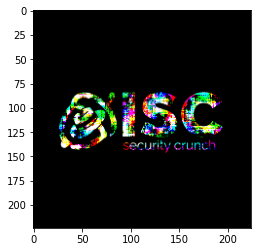

Predicted: attention_bumpers Adversarial loss: 0.015850266441702843 Confidence: 98.4274685382843 %


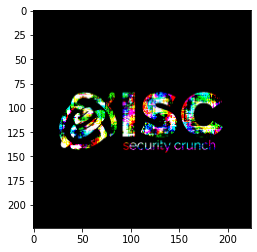

Predicted: attention_bumpers Adversarial loss: 0.009885049425065517 Confidence: 99.01636242866516 %


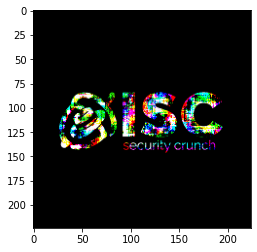

Predicted: attention_bumpers Adversarial loss: 0.008579183369874954 Confidence: 99.14575219154358 %


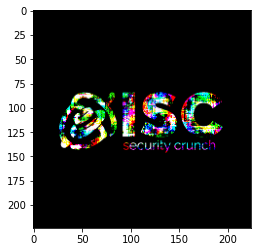

Predicted: attention_bumpers Adversarial loss: 0.008100040256977081 Confidence: 99.19326901435852 %


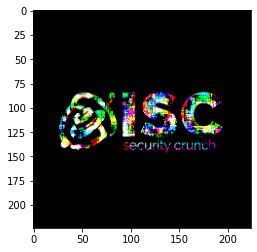

Predicted: attention_bumpers Adversarial loss: 0.009388109669089317 Confidence: 99.06558394432068 %


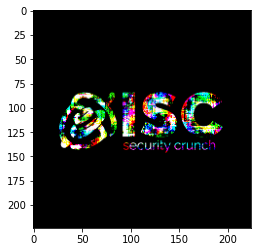

Predicted: attention_bumpers Adversarial loss: 0.013728718273341656 Confidence: 98.63650798797607 %


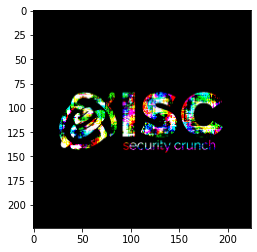

Predicted: attention_bumpers Adversarial loss: 0.004034000914543867 Confidence: 99.59741234779358 %


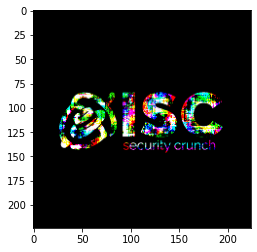

Predicted: attention_bumpers Adversarial loss: 0.010866278782486916 Confidence: 98.9192545413971 %


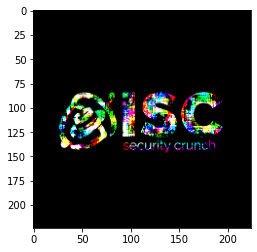

Predicted: attention_bumpers Adversarial loss: 0.0029666482005268335 Confidence: 99.70377683639526 %


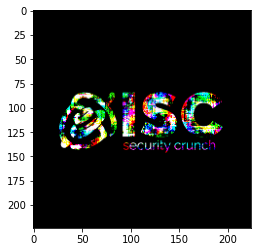

Predicted: attention_bumpers Adversarial loss: 0.006487262435257435 Confidence: 99.3533730506897 %


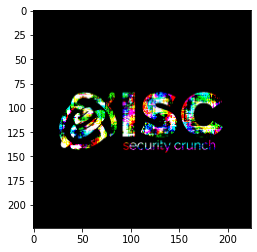

Predicted: attention_bumpers Adversarial loss: 0.025310657918453217 Confidence: 97.50069975852966 %


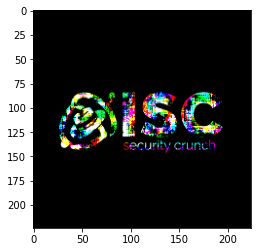

Predicted: attention_bumpers Adversarial loss: 0.003538658143952489 Confidence: 99.64675903320312 %


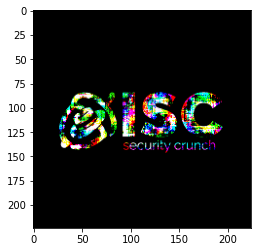

Predicted: attention_bumpers Adversarial loss: 0.0022699085529893637 Confidence: 99.77326393127441 %


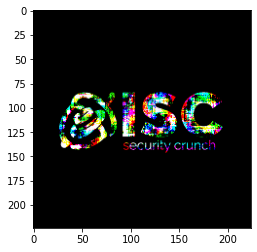

Predicted: attention_bumpers Adversarial loss: 0.0040006376802921295 Confidence: 99.60073828697205 %


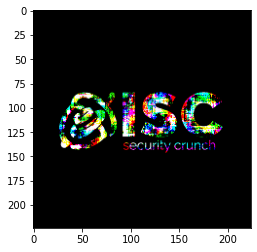

Predicted: attention_bumpers Adversarial loss: 0.00709194503724575 Confidence: 99.29331541061401 %


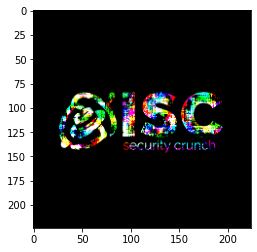

Predicted: attention_bumpers Adversarial loss: 0.0033702023793011904 Confidence: 99.66354966163635 %


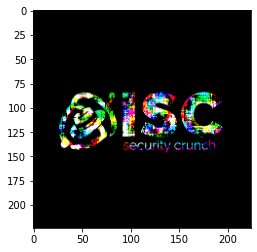

Predicted: attention_bumpers Adversarial loss: 0.004517112858593464 Confidence: 99.54930543899536 %


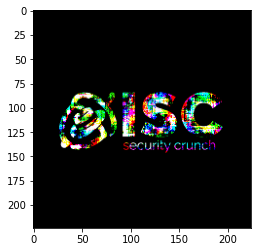

Predicted: attention_bumpers Adversarial loss: 0.006588640622794628 Confidence: 99.34329986572266 %


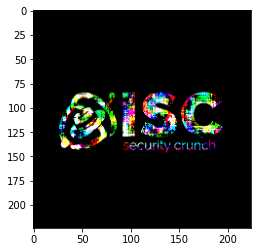

Predicted: attention_bumpers Adversarial loss: 0.004166850354522467 Confidence: 99.58418011665344 %


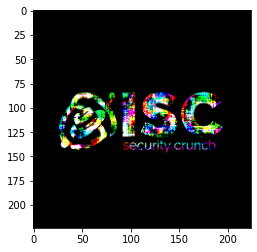

Predicted: attention_bumpers Adversarial loss: 0.0069545116275548935 Confidence: 99.3069589138031 %


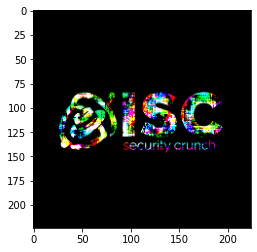

Predicted: attention_bumpers Adversarial loss: 0.012160095386207104 Confidence: 98.79135489463806 %


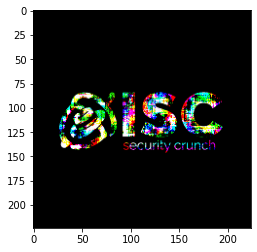

Predicted: attention_bumpers Adversarial loss: 0.00380589603446424 Confidence: 99.62013363838196 %


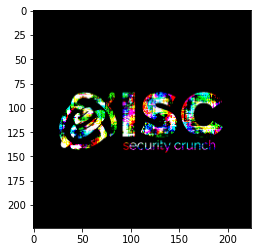

Predicted: attention_bumpers Adversarial loss: 0.005937438458204269 Confidence: 99.4080126285553 %


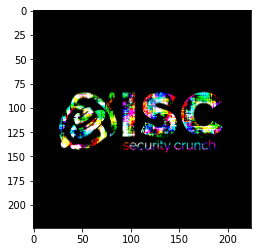

Predicted: attention_bumpers Adversarial loss: 0.01584087871015072 Confidence: 98.42839241027832 %


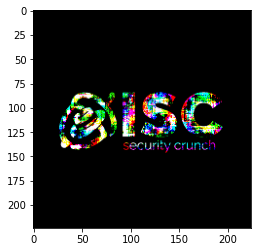

Predicted: attention_bumpers Adversarial loss: 0.003716705832630396 Confidence: 99.62902069091797 %


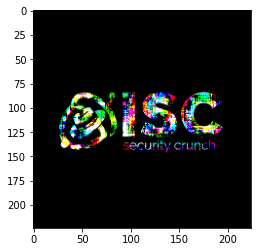

Predicted: attention_bumpers Adversarial loss: 0.003444929840043187 Confidence: 99.65609908103943 %


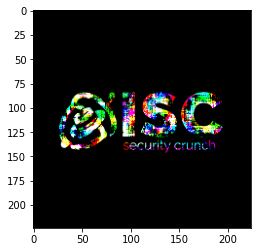

Predicted: attention_bumpers Adversarial loss: 0.004877336323261261 Confidence: 99.51345324516296 %


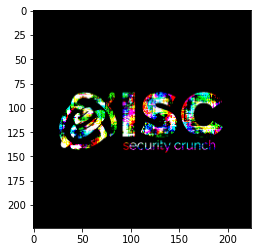

Predicted: attention_bumpers Adversarial loss: 0.006448769476264715 Confidence: 99.35719966888428 %


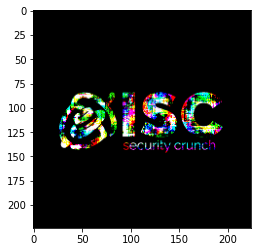

Predicted: attention_bumpers Adversarial loss: 0.0072587099857628345 Confidence: 99.27675724029541 %


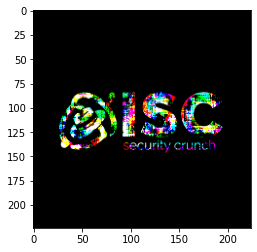

Predicted: attention_bumpers Adversarial loss: 0.005616360809653997 Confidence: 99.439936876297 %


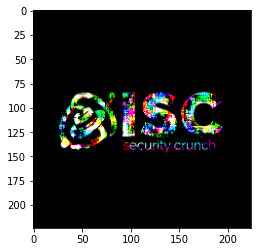

Predicted: attention_bumpers Adversarial loss: 0.006866903975605965 Confidence: 99.31566119194031 %


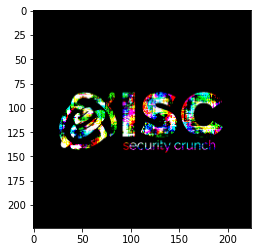

Predicted: attention_bumpers Adversarial loss: 0.017073553055524826 Confidence: 98.30713868141174 %


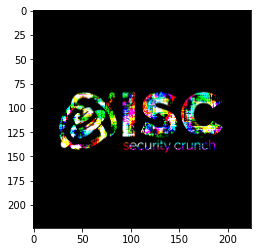

Predicted: attention_bumpers Adversarial loss: 0.013306738808751106 Confidence: 98.67814183235168 %


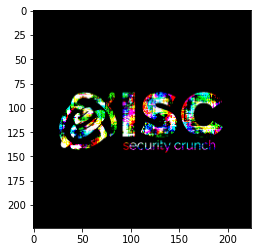

Predicted: attention_bumpers Adversarial loss: 0.005646707024425268 Confidence: 99.43692088127136 %


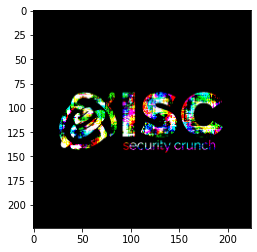

Predicted: attention_bumpers Adversarial loss: 0.003101659705862403 Confidence: 99.6903121471405 %


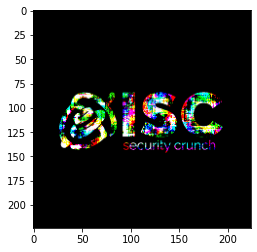

Predicted: attention_bumpers Adversarial loss: 0.004247334785759449 Confidence: 99.57616925239563 %


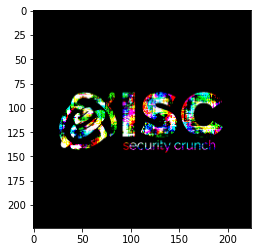

Predicted: attention_bumpers Adversarial loss: 0.008265928365290165 Confidence: 99.17681217193604 %


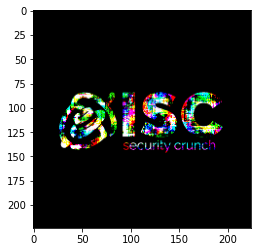

Predicted: attention_bumpers Adversarial loss: 0.008863627910614014 Confidence: 99.11755323410034 %


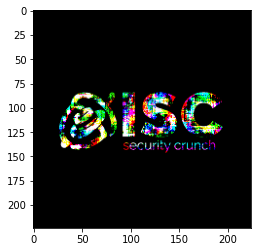

Predicted: attention_bumpers Adversarial loss: 0.04092128574848175 Confidence: 95.9904670715332 %


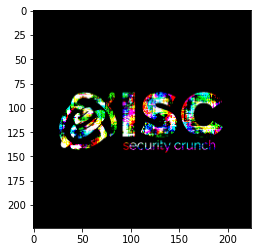

Predicted: attention_bumpers Adversarial loss: 0.002114800037816167 Confidence: 99.78874325752258 %


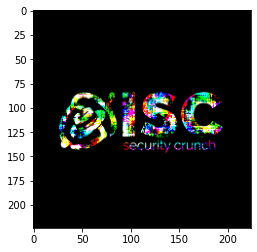

Predicted: attention_bumpers Adversarial loss: 0.004876387305557728 Confidence: 99.5135486125946 %


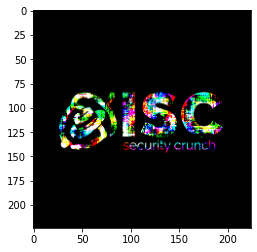

Predicted: attention_bumpers Adversarial loss: 0.003864203579723835 Confidence: 99.61432814598083 %


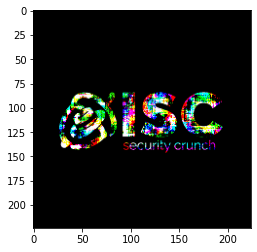

Predicted: attention_bumpers Adversarial loss: 0.0069722686894237995 Confidence: 99.30520057678223 %


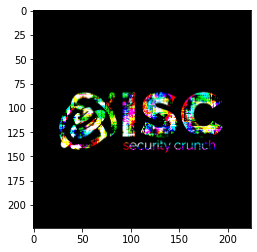

Predicted: attention_bumpers Adversarial loss: 0.00938929058611393 Confidence: 99.06546473503113 %


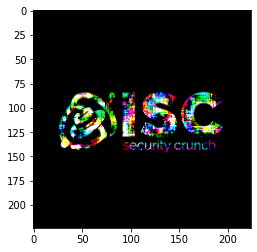

Predicted: attention_bumpers Adversarial loss: 0.0045376429334282875 Confidence: 99.54726099967957 %


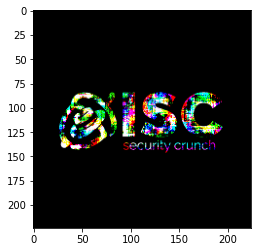

Predicted: attention_bumpers Adversarial loss: 0.008696185424923897 Confidence: 99.13415312767029 %


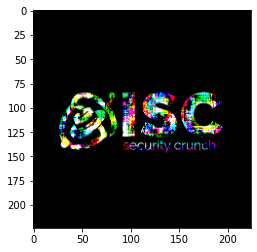

Predicted: attention_bumpers Adversarial loss: 0.0184504222124815 Confidence: 98.17187190055847 %


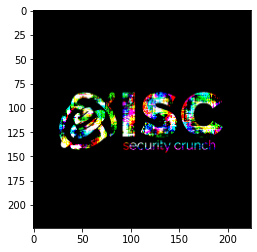

Predicted: attention_bumpers Adversarial loss: 0.009834292344748974 Confidence: 99.0213930606842 %


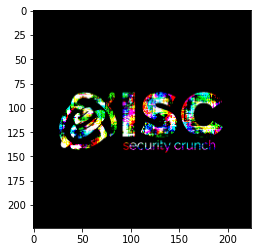

Predicted: attention_bumpers Adversarial loss: 0.00889245793223381 Confidence: 99.1146981716156 %


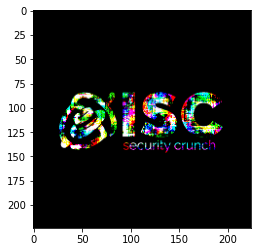

Predicted: attention_bumpers Adversarial loss: 0.01252958457916975 Confidence: 98.75485897064209 %


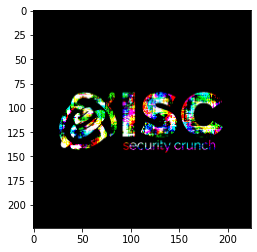

Predicted: attention_bumpers Adversarial loss: 0.010948113165795803 Confidence: 98.9111602306366 %


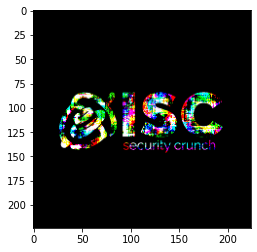

Predicted: attention_bumpers Adversarial loss: 0.006262204144150019 Confidence: 99.37573671340942 %


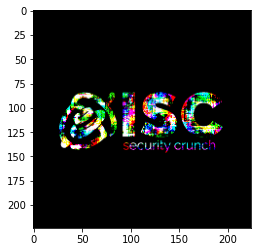

Predicted: attention_bumpers Adversarial loss: 0.005094641353935003 Confidence: 99.49182868003845 %


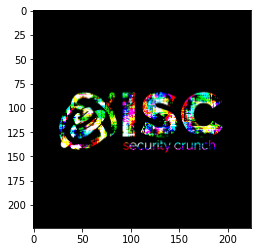

Predicted: attention_bumpers Adversarial loss: 0.007924782112240791 Confidence: 99.2106556892395 %


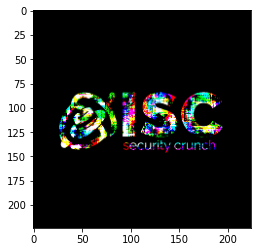

Predicted: attention_bumpers Adversarial loss: 0.004341225605458021 Confidence: 99.56681728363037 %


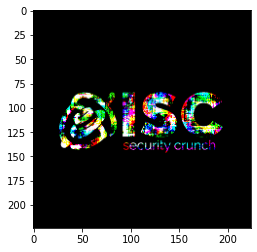

Predicted: attention_bumpers Adversarial loss: 0.004104642663151026 Confidence: 99.59037899971008 %


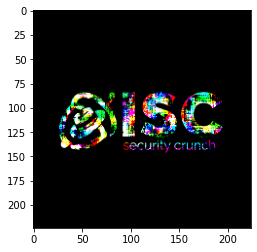

Predicted: attention_bumpers Adversarial loss: 0.009235164150595665 Confidence: 99.08073544502258 %


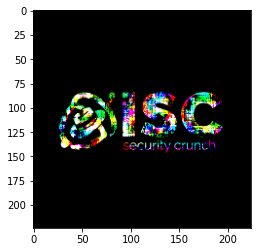

Predicted: attention_bumpers Adversarial loss: 0.006052262149751186 Confidence: 99.39660429954529 %


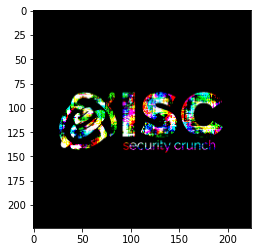

Predicted: attention_bumpers Adversarial loss: 0.004700088407844305 Confidence: 99.53109622001648 %


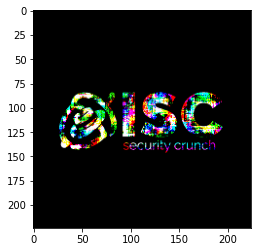

Predicted: attention_bumpers Adversarial loss: 0.0061373342759907246 Confidence: 99.38814640045166 %


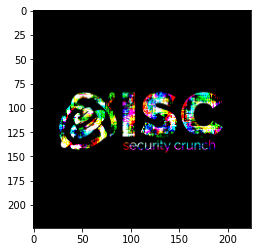

Predicted: attention_bumpers Adversarial loss: 0.005767608527094126 Confidence: 99.42489862442017 %


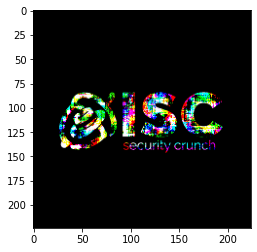

Predicted: attention_bumpers Adversarial loss: 0.0026415237225592136 Confidence: 99.7361958026886 %


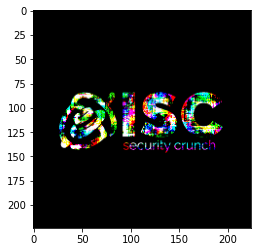

Predicted: attention_bumpers Adversarial loss: 0.018148908391594887 Confidence: 98.20147752761841 %


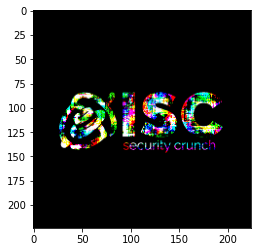

Predicted: attention_bumpers Adversarial loss: 0.0045740739442408085 Confidence: 99.54363703727722 %


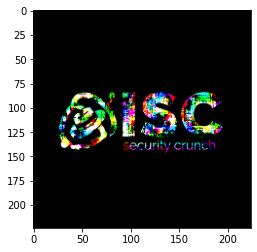

Predicted: attention_bumpers Adversarial loss: 0.0026908640284091234 Confidence: 99.73127245903015 %


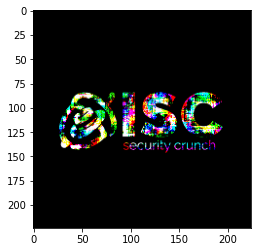

Predicted: attention_bumpers Adversarial loss: 0.006120628211647272 Confidence: 99.3898093700409 %


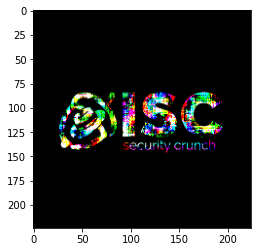

Predicted: attention_bumpers Adversarial loss: 0.005248695611953735 Confidence: 99.4765043258667 %


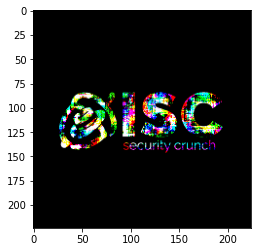

Predicted: attention_bumpers Adversarial loss: 0.005736199207603931 Confidence: 99.4280219078064 %


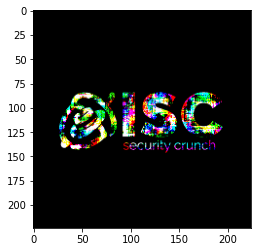

Predicted: attention_bumpers Adversarial loss: 0.003613848239183426 Confidence: 99.63926672935486 %


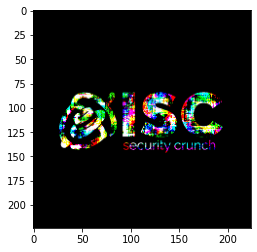

Predicted: attention_bumpers Adversarial loss: 0.0033149549271911383 Confidence: 99.66905117034912 %


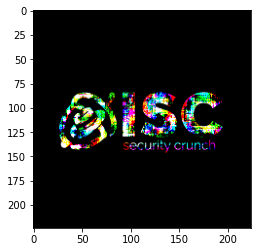

Predicted: attention_bumpers Adversarial loss: 0.0026400971692055464 Confidence: 99.73633885383606 %


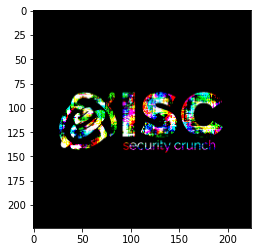

Predicted: attention_bumpers Adversarial loss: 0.02521825209259987 Confidence: 97.50970602035522 %


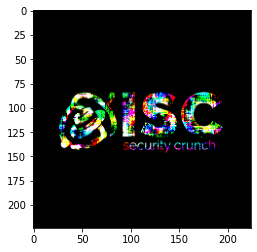

Predicted: attention_bumpers Adversarial loss: 0.0044632344506680965 Confidence: 99.55466985702515 %


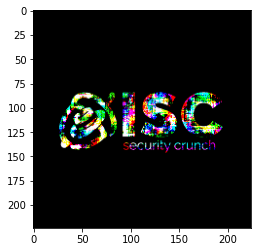

Predicted: attention_bumpers Adversarial loss: 0.00545928068459034 Confidence: 99.45555925369263 %


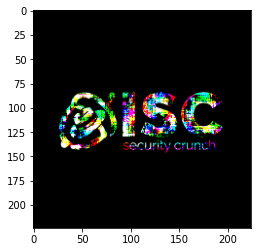

Predicted: attention_bumpers Adversarial loss: 0.0033144797198474407 Confidence: 99.66909885406494 %


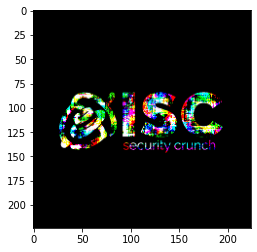

Predicted: attention_bumpers Adversarial loss: 0.007732695899903774 Confidence: 99.2297112941742 %


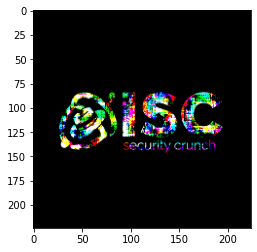

Predicted: attention_bumpers Adversarial loss: 0.003984133247286081 Confidence: 99.60237741470337 %


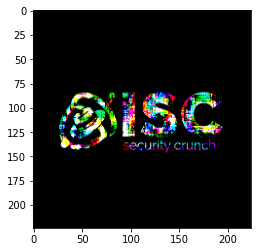

Predicted: attention_bumpers Adversarial loss: 0.007287586107850075 Confidence: 99.27389025688171 %


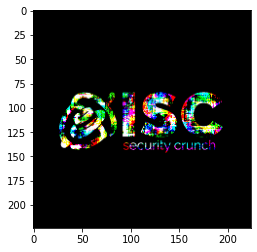

Predicted: attention_bumpers Adversarial loss: 0.005715812090784311 Confidence: 99.43004846572876 %


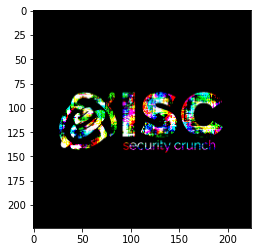

Predicted: attention_bumpers Adversarial loss: 0.0028820191510021687 Confidence: 99.71221089363098 %


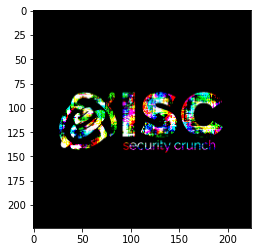

Predicted: attention_bumpers Adversarial loss: 0.010727476328611374 Confidence: 98.93298745155334 %


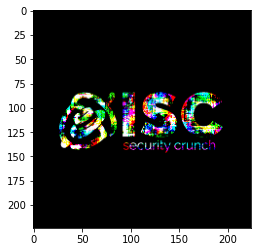

Predicted: attention_bumpers Adversarial loss: 0.0037091048434376717 Confidence: 99.62977766990662 %


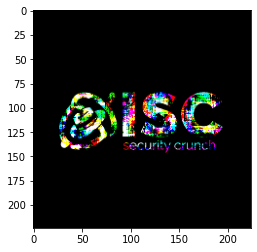

Predicted: attention_bumpers Adversarial loss: 0.0063684615306556225 Confidence: 99.36517477035522 %


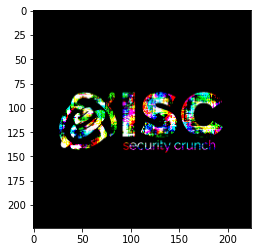

Predicted: attention_bumpers Adversarial loss: 0.0064079053699970245 Confidence: 99.36125874519348 %


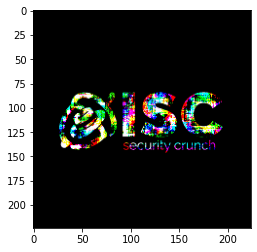

Predicted: attention_bumpers Adversarial loss: 0.0048715234734117985 Confidence: 99.51403141021729 %


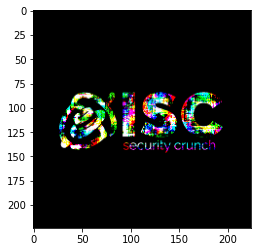

Predicted: attention_bumpers Adversarial loss: 0.006710730958729982 Confidence: 99.33117628097534 %


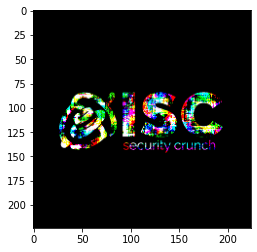

Predicted: attention_bumpers Adversarial loss: 0.0027155925054103136 Confidence: 99.72881078720093 %


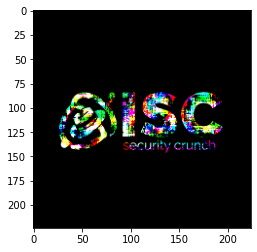

Predicted: attention_bumpers Adversarial loss: 0.004526488017290831 Confidence: 99.54837560653687 %


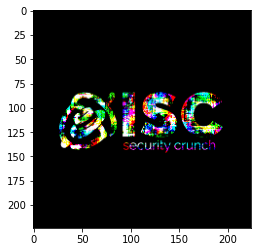

Predicted: attention_bumpers Adversarial loss: 0.006574547849595547 Confidence: 99.34470057487488 %


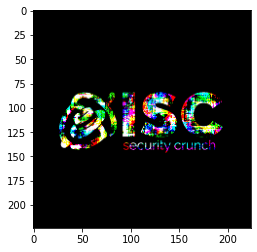

Predicted: attention_bumpers Adversarial loss: 0.007352909538894892 Confidence: 99.26740527153015 %


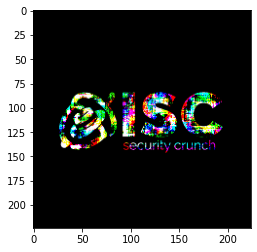

Predicted: attention_bumpers Adversarial loss: 0.00549342529848218 Confidence: 99.45216178894043 %


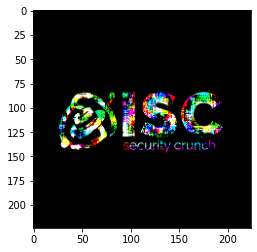

Predicted: attention_bumpers Adversarial loss: 0.006700547412037849 Confidence: 99.33218359947205 %


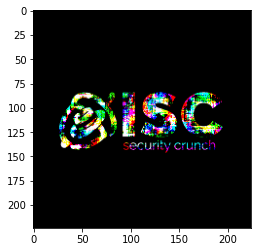

Predicted: attention_bumpers Adversarial loss: 0.002640453865751624 Confidence: 99.7363030910492 %


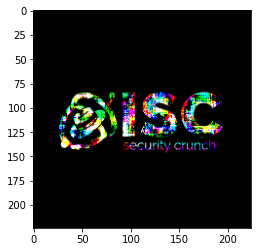

Predicted: attention_bumpers Adversarial loss: 0.004207924474030733 Confidence: 99.58009123802185 %


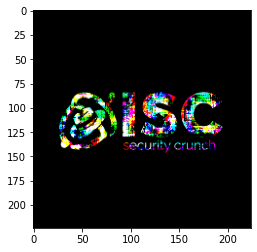

Predicted: attention_bumpers Adversarial loss: 0.006118258461356163 Confidence: 99.39004182815552 %


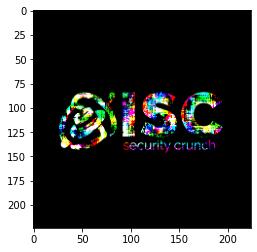

Predicted: attention_bumpers Adversarial loss: 0.0022506401874125004 Confidence: 99.77518916130066 %


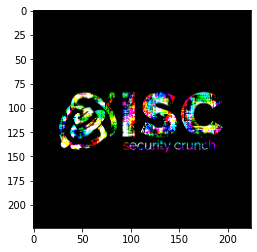

Predicted: attention_bumpers Adversarial loss: 0.0029155388474464417 Confidence: 99.70887303352356 %


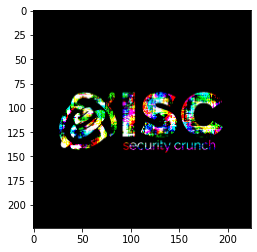

Predicted: attention_bumpers Adversarial loss: 0.0035303430631756783 Confidence: 99.6475875377655 %


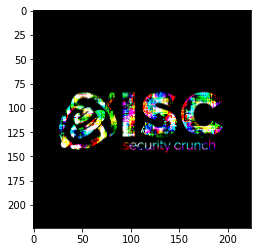

Predicted: attention_bumpers Adversarial loss: 0.0035710867960006 Confidence: 99.6435284614563 %


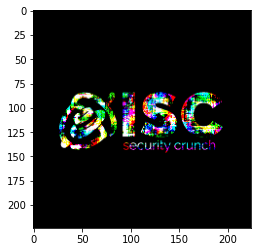

Predicted: attention_bumpers Adversarial loss: 0.0024391443002969027 Confidence: 99.75638389587402 %


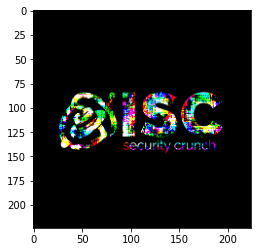

Predicted: attention_bumpers Adversarial loss: 0.00362905184738338 Confidence: 99.63775277137756 %


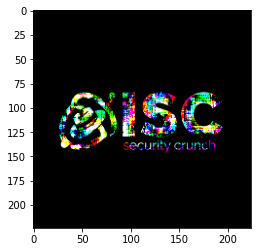

Predicted: attention_bumpers Adversarial loss: 0.00505455257371068 Confidence: 99.4958221912384 %


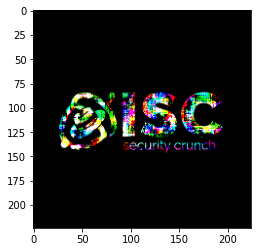

Predicted: attention_bumpers Adversarial loss: 0.004236295353621244 Confidence: 99.5772659778595 %


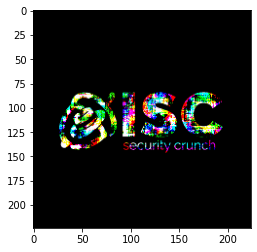

Predicted: attention_bumpers Adversarial loss: 0.006070983130484819 Confidence: 99.39473867416382 %


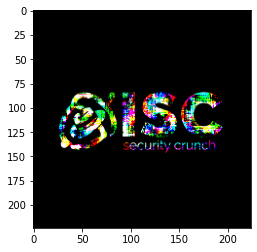

Predicted: attention_bumpers Adversarial loss: 0.002261582762002945 Confidence: 99.77409839630127 %


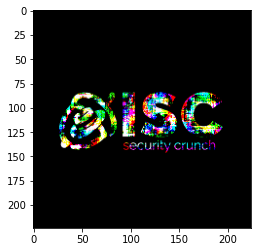

Predicted: attention_bumpers Adversarial loss: 0.006155698094516993 Confidence: 99.38632249832153 %


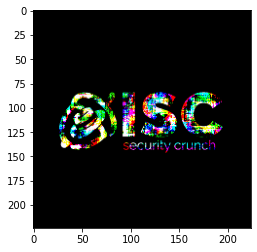

Predicted: attention_bumpers Adversarial loss: 0.0031065321527421474 Confidence: 99.68982934951782 %


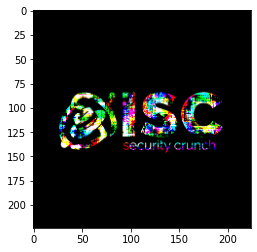

Predicted: attention_bumpers Adversarial loss: 0.004300869069993496 Confidence: 99.57083463668823 %


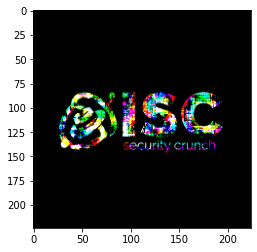

Predicted: attention_bumpers Adversarial loss: 0.0054933070205152035 Confidence: 99.45217370986938 %


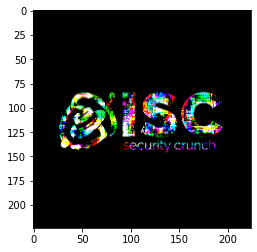

Predicted: attention_bumpers Adversarial loss: 0.0021422787103801966 Confidence: 99.78600144386292 %


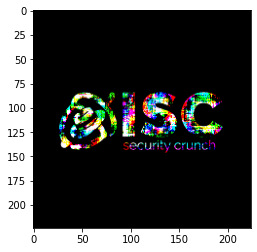

Predicted: attention_bumpers Adversarial loss: 0.004310958087444305 Confidence: 99.569833278656 %


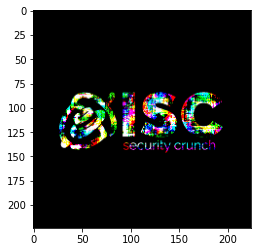

Predicted: attention_bumpers Adversarial loss: 0.0033419255632907152 Confidence: 99.66636300086975 %


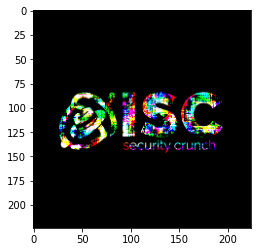

Predicted: attention_bumpers Adversarial loss: 0.0017720249015837908 Confidence: 99.82295632362366 %


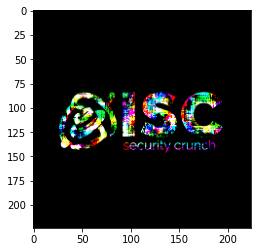

Predicted: attention_bumpers Adversarial loss: 0.002214719308540225 Confidence: 99.77877140045166 %


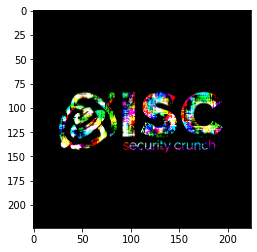

Predicted: attention_bumpers Adversarial loss: 0.005891695152968168 Confidence: 99.41256046295166 %


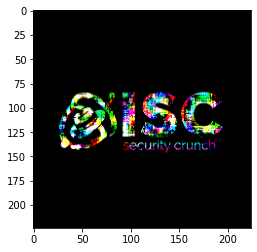

Predicted: attention_bumpers Adversarial loss: 0.0028561060316860676 Confidence: 99.71479773521423 %


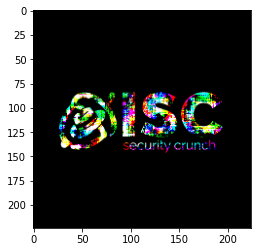

Predicted: attention_bumpers Adversarial loss: 0.007572517264634371 Confidence: 99.24560785293579 %


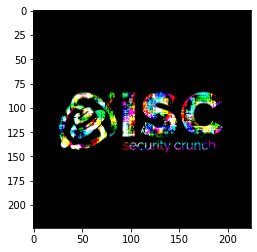

Predicted: attention_bumpers Adversarial loss: 0.0045236400328576565 Confidence: 99.54865574836731 %


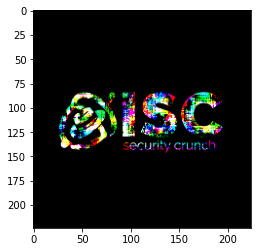

Predicted: attention_bumpers Adversarial loss: 0.0071468655951321125 Confidence: 99.28786158561707 %


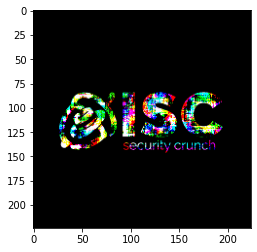

Predicted: attention_bumpers Adversarial loss: 0.004802952986210585 Confidence: 99.52085614204407 %


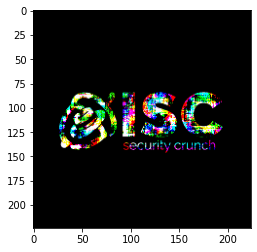

Predicted: attention_bumpers Adversarial loss: 0.0017363247461616993 Confidence: 99.82652068138123 %


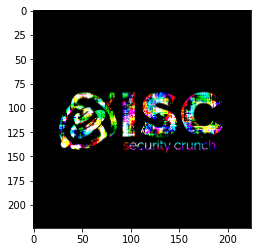

Predicted: attention_bumpers Adversarial loss: 0.0029264739714562893 Confidence: 99.70778226852417 %


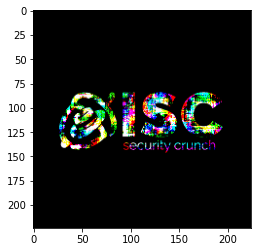

Predicted: attention_bumpers Adversarial loss: 0.0018054627580568194 Confidence: 99.81961846351624 %


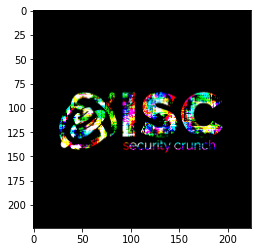

Predicted: attention_bumpers Adversarial loss: 0.00568297877907753 Confidence: 99.43331480026245 %


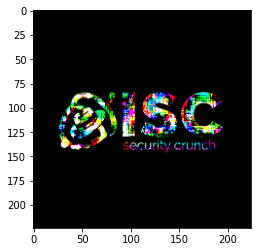

Predicted: attention_bumpers Adversarial loss: 0.004612045828253031 Confidence: 99.53985810279846 %


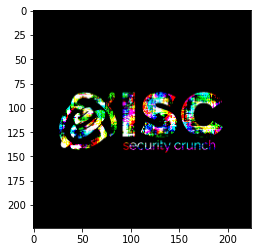

Predicted: attention_bumpers Adversarial loss: 0.004370186012238264 Confidence: 99.56393241882324 %


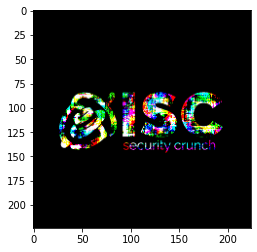

Predicted: attention_bumpers Adversarial loss: 0.0017945152940228581 Confidence: 99.82070922851562 %


In [12]:
import cv2
import numpy as np


# [TODO 4]: pick a shape for the adversarial sample
# it should have 1 batch, 3 channels, 224px pixels in height and 224px in width
adversarial_sample_shape = (1, 3, 224, 224)
adversarial_sample = torch.rand(adversarial_sample_shape)

# enable gradient-based optimizations for this tensor
adversarial_sample.requires_grad_()

# [TODO 5] pick a learning rate (lr); try not to go over 1 or too close to 0
adversarial_lr = 0.43456
adversarial_optimizer = torch.optim.Adam([adversarial_sample], lr=adversarial_lr)

# [TODO 6]: pick a targeted adversarial class (remember the 2 dictionaries at the beginning?)
targeted_traffic_sign_id = 22
targeted_adversarial_class = torch.LongTensor([targeted_traffic_sign_id])

# using CrossEntropy loss in this scenario
adversarial_criterion = torch.nn.CrossEntropyLoss()

# loading the ISC mask 
mask_path = 'isc-mask.png'
mask = cv2.imread(mask_path)
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

# tensor conversion
mask = torch.FloatTensor(mask).unsqueeze(0).unsqueeze(0) / 255

# [TODO 8]: use the ISC mask as current mask
crt_mask = mask

# [TODO 9]: find a way to invert the mask so instead of coloring the background, the algorithm colors the foreground (logo)
# PS: python supports basic numeric opperations between scalars and tensors / matrices; you don't have to use loops or complex code
crt_mask = 1 - mask

# [TODO 7]: define a number of epochs; start small and see what works for you
num_epochs = 80



for i in range(300):

  adversarial_optimizer.zero_grad()

  crt_input = torch.sigmoid(adversarial_sample)

  if crt_mask is not None:
    crt_input = torch.sigmoid(adversarial_sample) * crt_mask

  y_pred = model(crt_input + 0.2 * (torch.rand_like(crt_input) * 2 - 1))

  loss = adversarial_criterion(y_pred, targeted_adversarial_class)

  adversarial_img = crt_input.detach().permute(0, 2, 3, 1)[0].numpy()

  plt.imshow(adversarial_img)
  plt.show()


  y_conf = torch.max(torch.softmax(y_pred, dim = 1), dim = 1)[0].item()
  y_pred = torch.argmax(y_pred, dim=1)[0].item()
  print('Predicted:', ID_TO_LABEL[y_pred], 'Adversarial loss:', loss.item(), 'Confidence:', y_conf * 100, '%')

  loss.backward()

  adversarial_optimizer.step()



# You made it!!

This is the end of this laboratory - it's still in beta so any feedback is welcome.

### Submission and Evaluation

Just download your **image** from colab and upload it on **curs.upb.ro** on the **assignment** made for this laboratory. You can easily download that file from the *Files* section in colab (the menu on the left). 

It will be verified using a checker that implements the same neural network.

### Conditions

* the resulted stylized image (with the ISC logo) must achive **over 80% (0.8) confidence** to be considered valid
* the background must remain black and only the foreground should get colored - just like in the shirt or demo

### Checker

You can use http://isc-lab.overfitted.io to upload your image and see the results (from your web browser). 

There's also this small API:




In [13]:
import requests

final_img = crt_input.detach().permute(0, 2, 3, 1)[0].numpy() * 255
final_img = cv2.cvtColor(final_img, cv2.COLOR_RGB2BGR)

cv2.imwrite('adversarial_sample.png', final_img)

files = {'img': open('adversarial_sample.png','rb')}
r = requests.post('http://isc-lab.overfitted.io/checker', files=files)

print(r.text)



{"label": "attention_bumpers", "confidence": 0.9974880218505859}
